In [1]:
# import packages for Google Colab
# from google.colab import drive
# from google.colab import files
import pandas as pd
import numpy as np
import os
import glob
import itertools
# import tensorflow as tf
import scipy

# to make this notebook's output stable across runs
np.random.seed(100)
# tf.random.set_seed(100)

%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt


# For connecting data from Google colab
# drive.mount('/content/drive')

In [2]:
# Python ≥3.7 is required
import sys
assert sys.version_info >= (3, 7)

# Scikit-Learn ≥0.20 is recommended
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
# import tensorflow as tf
# from tensorflow import keras
# assert tf.__version__ >= "2.0"


In [3]:
# Load packages for .las and .dlis files
# !pip install lasio
# !pip install dlisio
import lasio
from dlisio import dlis

In [5]:
# Load Survey logs

# Training wells
well_A_inc = lasio.read("./frac_data/training_data/A_Inclination.las", engine='normal').df()
well_B_inc = lasio.read("./frac_data/training_data/B_Inclination.las", engine='normal').df()
well_C_inc = lasio.read("./frac_data/training_data/C_Inclination.las", engine='normal').df()
well_D_inc = lasio.read("./frac_data/training_data/D_Inclination.las", engine='normal').df()
well_E_inc = lasio.read("./frac_data/training_data/E_Inclination.las", engine='normal').df()
well_F_inc = lasio.read("./frac_data/training_data/F_Inclination.las", engine='normal').df()
well_G_inc = lasio.read("./frac_data/training_data/G_Inclination.las", engine='normal').df()
well_H_inc = lasio.read("./frac_data/training_data/H_Inclination.las", engine='normal').df()

# Test wells
well_T1_inc = lasio.read("./frac_data/test_data/T1_Inclination.las", engine='normal').df()
well_T2_inc = lasio.read("./frac_data/test_data/T2_Inclination.las", engine='normal').df()

well_A_inc.columns

Index(['AZ_OF_P1', 'AZI', 'CAL2', 'CAL4', 'CAL6', 'CAL8', 'CALX', 'CALY',
       'DEV', 'DMAX', 'DMIN', 'GR', 'HAZI', 'RB_OF_P1', 'ROT'],
      dtype='object')

In [6]:
# Load Basic logs

# Training wells
well_A_log = lasio.read('./frac_data/training_data/A_Logs.las', engine='normal').df()
well_B_log = lasio.read('./frac_data/training_data/B_Logs.las', engine='normal').df()
well_C_log = lasio.read('./frac_data/training_data/C_Logs.las', engine='normal').df()
well_D_log = lasio.read('./frac_data/training_data/D_Logs.las', engine='normal').df()
well_E_log = lasio.read('./frac_data/training_data/E_Logs.las', engine='normal').df()
well_F_log = lasio.read('./frac_data/training_data/F_Logs.las', engine='normal').df()
well_G_log = lasio.read('./frac_data/training_data/G_Logs.las', engine='normal').df()
well_H_log = lasio.read('./frac_data/training_data/H_Logs.las', engine='normal').df()

# Test wells
well_T1_log = lasio.read('./frac_data/test_data/T1_Logs.las', engine='normal').df()
well_T2_log = lasio.read('./frac_data/test_data/T2_Logs.las', engine='normal').df()

well_A_log.columns

Index(['DT', 'GR', 'ILD', 'NPOR_LIM', 'PEF', 'RHO'], dtype='object')

In [7]:
frac = pd.read_csv(r"./frac_data/Fracture_data.csv")
frac

,Index,Well,MD,ANGLE,AZIMUTH,Depth,ADIPnew,AAZInew,DIP_TYPE
0,0,A,115.9780,72.7027,275.1597,116.0580,42.7760,275.2326,Fracture
1,1,A,135.0881,77.6677,353.8462,135.0581,72.7666,353.8209,Fracture
2,2,A,139.1479,34.9659,22.2341,139.1479,35.0617,21.9782,Fracture
3,3,A,140.8838,40.1933,292.8713,140.8838,40.4759,293.0215,Fracture
4,4,A,143.1767,61.0260,329.1889,143.2967,61.2799,329.1402,Fracture
...,...,...,...,...,...,...,...,...,...
110,110,H,411.4756,54.8860,126.8316,411.4556,38.7575,126.4116,Fracture
111,111,H,411.4869,50.1351,128.3640,411.5369,29.0065,127.8974,Fracture
112,112,H,411.5398,38.2001,121.7808,411.5198,37.1581,120.9156,Fracture
113,113,H,411.5839,70.5446,313.1348,411.5839,71.6940,313.2824,Fracture


Use "Depth", "ADIPnew", and "AAZInew" for the apparent dip and azimuth for the fracture depth.

In [8]:
# Identify number of fractures per well
print("number of fractures in Well A is ", len(frac[frac['Well']=='A']))
print("number of fractures in Well B is ", len(frac[frac['Well']=='B']))
print("number of fractures in Well C is ", len(frac[frac['Well']=='C']))
print("number of fractures in Well D is ", len(frac[frac['Well']=='D']))
print("number of fractures in Well E is ", len(frac[frac['Well']=='E']))
print("number of fractures in Well F is ", len(frac[frac['Well']=='F']))
print("number of fractures in Well G is ", len(frac[frac['Well']=='G']))
print("number of fractures in Well H is ", len(frac[frac['Well']=='H']))
print("===============================================")
print("number of fractures in Well T1 is ", "unknown") # test well 1
print("number of fractures in Well T2 is ", "unknown") # test well 2

number of fractures in Well A is  29
number of fractures in Well B is  5
number of fractures in Well C is  11
number of fractures in Well D is  6
number of fractures in Well E is  8
number of fractures in Well F is  7
number of fractures in Well G is  6
number of fractures in Well H is  43
number of fractures in Well T1 is  unknown
number of fractures in Well T2 is  unknown


In [9]:
# Load 10 dlis files for image data
well_A_dlis, *tail = dlis.load('./frac_data/training_data/Well_A_Image.dlis')
well_B_dlis, *tail = dlis.load('./frac_data/training_data/Well_B_Image.dlis')
well_C_dlis, *tail = dlis.load('./frac_data/training_data/Well_C_Image.dlis')
well_D_dlis, *tail = dlis.load('./frac_data/training_data/Well_D_Image.dlis')
well_E_dlis, *tail = dlis.load('./frac_data/training_data/Well_E_Image.dlis')
well_F_dlis, *tail = dlis.load('./frac_data/training_data/Well_F_Image.dlis')
well_G_dlis, *tail = dlis.load('./frac_data/training_data/Well_G_Image.dlis')
well_H_dlis, *tail = dlis.load('./frac_data/training_data/Well_H_Image.dlis')

well_T1_dlis, *tail = dlis.load('./frac_data/test_data/Well_T1_Image.dlis')
well_T2_dlis, *tail = dlis.load('./frac_data/test_data/Well_T2_Image.dlis')


In [10]:
for frame in well_A_dlis.frames:
    # Search through the channels for the index and obtain the units
    for channel in frame.channels:
        if channel.name == frame.index:
            depth_units = channel.units
    print(f'Frame Name: \t\t {frame.name}')
    print(f'Index Type: \t\t {frame.index_type}')
    print(f'Depth Interval: \t {frame.index_min} - {frame.index_max} {depth_units}')
    print(f'Depth Spacing: \t\t {frame.spacing} {depth_units}')
    print(f'Direction: \t\t {frame.direction}')
    print(f'Num of Channels: \t {len(frame.channels)}')
    print(f'Channel Names: \t\t {str(frame.channels)}')
    print('\n\n')


Frame Name: 		 IMAGE
Index Type: 		 BOREHOLE-DEPTH
Depth Interval: 	 114.0 - 447.8 m
Depth Spacing: 		 0.002 m
Direction: 		 INCREASING
Num of Channels: 	 2
Channel Names: 		 [Channel(INDEX2853), Channel(IMVIEW1)]





In [11]:
# Normalization (or scaling) is required (0 to 255 scale)
dlis_wells = [well_A_dlis, well_B_dlis, well_C_dlis, well_D_dlis, well_E_dlis, well_F_dlis, well_G_dlis, well_H_dlis, well_T1_dlis, well_T2_dlis]

for well in dlis_wells:
    print("min and max values of the ", str(well), " is ", np.min(well.object('FRAME','IMAGE').curves()['IMVIEW1']), " and ", np.max(well.object('FRAME','IMAGE').curves()['IMVIEW1']))



min and max values of the  LogicalFile(A)  is  0  and  148
min and max values of the  LogicalFile(B)  is  0  and  148
min and max values of the  LogicalFile(C)  is  0  and  148
min and max values of the  LogicalFile(D)  is  0  and  152
min and max values of the  LogicalFile(E)  is  0  and  148
min and max values of the  LogicalFile(F)  is  0  and  148
min and max values of the  LogicalFile(G)  is  0  and  148
min and max values of the  LogicalFile(H)  is  0  and  148
min and max values of the  LogicalFile(T1)  is  0  and  152
min and max values of the  LogicalFile(T2)  is  0  and  152


In [12]:
# Create a dataframe for image data
well_images = {}
list_of_well_images = []

for well in dlis_wells:
  print("well is ", well)
  print("index is ", well.channels[0])
  print("data is ", well.channels[1])
  print("===============================")
  curves = well.object('FRAME','IMAGE').curves()
  well_name = "well_" + str(well)[12:-1]
  well_images[well_name] = pd.DataFrame(curves[str(well.channels[1])[8:-1]], index = curves[str(well.channels[0])[8:-1]]).mul(255.0/np.max(curves[str(well.channels[1])[8:-1]])) # image array data (scale to 0 and 255 to maximize the contrast)
  # well_images[well_name] = pd.DataFrame(curves[str(well.channels[1])[8:-1]], index = curves[str(well.channels[0])[8:-1]]) # image array data

print("Done!")

well is  LogicalFile(A)
index is  Channel(INDEX2853)
data is  Channel(IMVIEW1)
well is  LogicalFile(B)
index is  Channel(INDEX4937)
data is  Channel(IMVIEW1)
well is  LogicalFile(C)
index is  Channel(INDEX3857)
data is  Channel(IMVIEW1)
well is  LogicalFile(D)
index is  Channel(INDEX4642)
data is  Channel(IMVIEW1)
well is  LogicalFile(E)
index is  Channel(INDEX5510)
data is  Channel(IMVIEW1)
well is  LogicalFile(F)
index is  Channel(INDEX2944)
data is  Channel(IMVIEW1)
well is  LogicalFile(G)
index is  Channel(INDEX4928)
data is  Channel(IMVIEW1)
well is  LogicalFile(H)
index is  Channel(INDEX1840)
data is  Channel(IMVIEW1)
well is  LogicalFile(T1)
index is  Channel(INDEX253)
data is  Channel(IMVIEW1)
well is  LogicalFile(T2)
index is  Channel(INDEX2647)
data is  Channel(IMVIEW1)
Done!


dict_keys(['well_A', 'well_B', 'well_C', 'well_D', 'well_E', 'well_F', 'well_G', 'well_H', 'well_T1', 'well_T2'])

,0,1,2,3,4,5,6,7,8,9,...,230,231,232,233,234,235,236,237,238,239
114.000,255.0,255.0,255.0,255.0,255.000000,255.000000,255.000000,255.00,75.810811,74.087838,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.0,255.0,255.0,255.0,255.0
114.002,255.0,255.0,255.0,255.0,255.000000,255.000000,255.000000,255.00,75.810811,74.087838,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.0,255.0,255.0,255.0,255.0
114.004,255.0,255.0,255.0,255.0,255.000000,255.000000,255.000000,255.00,75.810811,75.810811,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.0,255.0,255.0,255.0,255.0
114.006,255.0,255.0,255.0,255.0,255.000000,255.000000,255.000000,255.00,75.810811,75.810811,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.0,255.0,255.0,255.0,255.0
114.008,255.0,255.0,255.0,255.0,255.000000,255.000000,255.000000,255.00,75.810811,75.810811,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.0,255.0,255.0,255.0,255.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
447.792,255.0,255.0,255.0,255.0,196.418919,196.418919,184.358108,191.25,155.067568,120.608108,...,111.993243,99.932432,103.378378,103.378378,96.486486,255.0,255.0,255.0,255.0,255.0
447.794,255.0,255.0,255.0,255.0,196.418919,196.418919,184.358108,191.25,153.344595,120.608108,...,111.993243,99.932432,103.378378,103.378378,96.486486,255.0,255.0,255.0,255.0,255.0
447.796,255.0,255.0,255.0,255.0,194.695946,196.418919,184.358108,191.25,153.344595,120.608108,...,111.993243,99.932432,103.378378,103.378378,96.486486,255.0,255.0,255.0,255.0,255.0
447.798,255.0,255.0,255.0,255.0,196.418919,196.418919,184.358108,191.25,153.344595,120.608108,...,111.993243,99.932432,103.378378,103.378378,96.486486,255.0,255.0,255.0,255.0,255.0


Let's plot these logs for a visual check.

In [16]:
# # Plot image logs for all wells
# plt.figure(figsize=(14,10))
# plt.subplot(1,10,1) # Well A
# plt.imshow(well_images["well_A"], extent=[0, 360, np.max(well_images["well_A"].index), np.min(well_images["well_A"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well A", weight="bold")
# plt.ylabel("Depth [m]", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.subplot(1,10,2) # Well B
# plt.imshow(well_images["well_B"], extent=[0, 360, np.max(well_images["well_B"].index), np.min(well_images["well_B"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well B", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.yticks([])
# plt.subplot(1,10,3) # Well C
# plt.imshow(well_images["well_C"], extent=[0, 360, np.max(well_images["well_C"].index), np.min(well_images["well_C"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well C", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.yticks([])
# plt.subplot(1,10,4) # Well D
# plt.imshow(well_images["well_D"], extent=[0, 360, np.max(well_images["well_D"].index), np.min(well_images["well_D"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well D", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.yticks([])
# plt.subplot(1,10,5) # Well E
# plt.imshow(well_images["well_E"], extent=[0, 360, np.max(well_images["well_E"].index), np.min(well_images["well_E"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well E", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.yticks([])
# plt.subplot(1,10,6) # Well F
# plt.imshow(well_images["well_F"], extent=[0, 360, np.max(well_images["well_F"].index), np.min(well_images["well_F"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well F", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.yticks([])
# plt.subplot(1,10,7) # Well G
# plt.imshow(well_images["well_G"], extent=[0, 360, np.max(well_images["well_G"].index), np.min(well_images["well_G"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well G", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.yticks([])
# plt.subplot(1,10,8) # Well H
# plt.imshow(well_images["well_H"], extent=[0, 360, np.max(well_images["well_H"].index), np.min(well_images["well_H"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well H", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.yticks([])
# plt.subplot(1,10,9) # Well T1
# plt.imshow(well_images["well_T1"], extent=[0, 360, np.max(well_images["well_T1"].index), np.min(well_images["well_T1"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well T1", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.yticks([])
# plt.subplot(1,10,10) # Well T2
# plt.imshow(well_images["well_T2"], extent=[0, 360, np.max(well_images["well_T2"].index), np.min(well_images["well_T2"].index)], cmap=cm_default, aspect='auto')
# plt.title("Well T2", weight="bold")
# plt.axis([0, 360, 600, 0])
# plt.yticks([])
# plt.show()


Let's see an example of a fracture on well H

In [16]:
# Plot well data for visual inspection
# cm_default = 'inferno_r' # similar color scheme to Techlog image logs
cm_default = 'YlOrBr_r' # similar color scheme to Techlog image logs

# plt.figure(figsize=(14,10))
# plt.subplot(181) # GR
# plt.plot(well_A_log.GR, well_A_log.index)
# plt.xlabel("GR [gAPI]", weight="bold")
# plt.ylabel("Depth [m]", weight="bold")
# plt.axis([0, 200, 500, 0])
# plt.subplot(182) # Resistivity
# plt.plot(well_A_log.ILD, well_A_log.index)
# plt.xscale("log")
# plt.xlabel("ILD [OHMM]", weight="bold")
# plt.axis([0.2, 20000, 500, 0])
# plt.yticks([])
# plt.subplot(183) # Neutron and Density
# plt.plot(well_A_log.NPOR_LIM, well_A_log.index)
# plt.xlabel("Neutron [v/v]", weight="bold")
# plt.axis([0.45, -0.15, 500, 0])
# plt.yticks([])
# plt.subplot(184) # Neutron and Density
# plt.plot(well_A_log.RHO/1000, well_A_log.index)
# plt.xlabel("Density [g/cm3]", weight="bold")
# plt.axis([1.71, 2.71, 500, 0])
# plt.yticks([])
# plt.subplot(185) # Sonic
# plt.plot(well_A_log.DT/3.28084, well_A_log.index) # unit conversion from us/m to us/ft
# plt.xlabel("DTC [us/ft]", weight="bold")
# plt.axis([200, 0, 500, 0])
# plt.title("Well A", weight="bold", fontsize=15)
# plt.yticks([])
# plt.subplot(186) # Azimuth
# plt.plot(well_A_inc.HAZI, well_A_inc.index)
# plt.axis([0, 360, 500, 0])
# plt.xlabel("Azi", weight="bold")
# plt.yticks([])
# plt.subplot(187) # Deviation
# plt.plot(well_A_inc.DEV, well_A_inc.index)
# plt.axis([0, 1, 500, 0])
# plt.xlabel("Dev", weight="bold")
# plt.yticks([])
# plt.subplot(188) # image logs
# plt.imshow(well_images["well_A"], extent=[0, 240, np.max(well_images["well_A"].index), np.min(well_images["well_A"].index)], cmap=cm_default, aspect='auto')
# plt.axis([0, 240, 500, 0])
# plt.xlabel("Image Logs", weight="bold")
# plt.yticks([])
# plt.show()



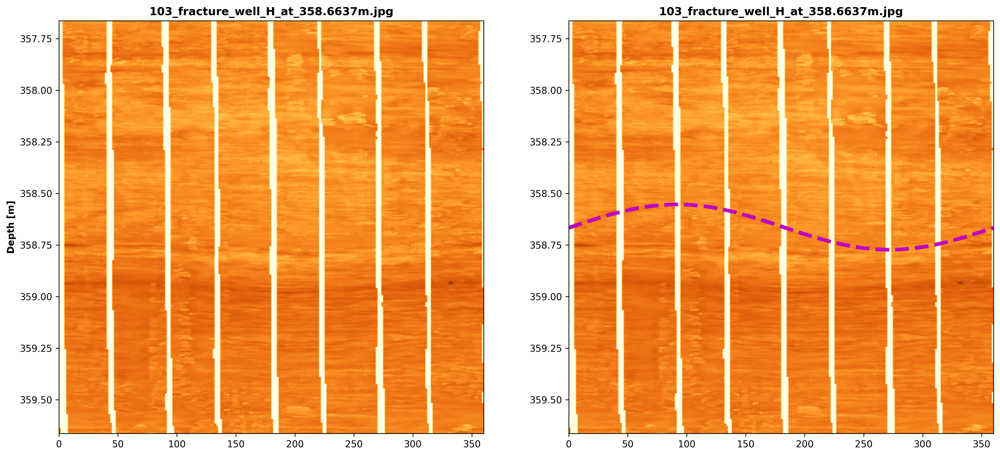

In [17]:
# An example of fracture on well H at 358.6637m
i = 103
well = frac.Well.iloc[i]
md = frac.Depth.iloc[i]
ang = frac.ADIPnew.iloc[i]
azi = frac.AAZInew.iloc[i]
title = str(i) + "_fracture_well_" + well + "_at_" + str(md) + "m.jpg"

# Generate x values from 0 to 240 (representing 0 to 360 degrees)
num_data_points = 240  # Number of data points in x-axis (for one period)
deg_per_point = 1.5  # Each data point represents 1.5 degrees
total_degrees = num_data_points * deg_per_point  # Total degrees = 360
x_values = np.linspace(0, total_degrees, num_data_points)

amplitude = 0.5 * 8.5 * 0.0254 * np.tan(np.radians(ang))  # 8.5 in diameter borehole, convert from inch to meter
top_depth = md - 1.0
bot_depth = md + 1.0
well_name = "well_" + well

idx_top = (np.abs(well_images[well_name].index - top_depth)).argmin()
idx_bot = (np.abs(well_images[well_name].index - bot_depth)).argmin()
image_data = well_images[well_name].iloc[idx_top:idx_bot]
y_values = amplitude * np.cos((2 * np.pi * (x_values - azi	- 0)) / 360) + md + 0

plt.figure(figsize=(18,8), dpi=300)
plt.subplot(121) # Without fracture line
plt.imshow(image_data, extent=[0, 360, bot_depth, top_depth], cmap='YlOrBr_r', aspect='auto')
plt.title(title, weight="bold")
plt.ylabel("Depth [m]", weight="bold")
plt.axis([0, 360, bot_depth, top_depth])
plt.subplot(122) # With fracture line
plt.imshow(image_data, extent=[0, 360, bot_depth, top_depth], cmap=cm_default, aspect='auto')
plt.plot(x_values, y_values, color='m', linewidth=4, linestyle='dashed')
plt.title(title, weight="bold")
plt.axis([0, 360, bot_depth, top_depth])
plt.show()


Please note that these fractures were selected by an experienced petrophysicist. Some fractures display a full sinusoidal curve, while others are partial. The reference depth for these fractures can vary, such as the inflection point, average depth, or other criteria. To ensure consistency, all fractures were extended to a full sinusoidal curve, with the corresponding depth set at the center of the cosine curve.

In [20]:
well_images["well_A"].describe()

,0,1,2,3,4,5,6,7,8,9,...,230,231,232,233,234,235,236,237,238,239
count,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,...,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000,166901.000000
mean,143.335534,143.012517,144.370746,144.458742,146.622769,149.941749,151.311571,152.021599,152.366501,151.780446,...,152.675365,153.559413,154.081762,154.733980,153.510666,150.802094,147.183945,145.929837,141.787882,145.882577
std,83.504027,83.007091,83.054473,83.227738,83.217692,83.146953,82.901339,82.887206,83.158240,83.639673,...,83.732432,83.953487,84.100040,84.643639,84.753920,84.095845,83.466802,83.531149,83.055387,84.258778
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,70.641892,70.641892,72.364865,72.364865,75.810811,79.256757,82.702703,82.702703,82.702703,80.979730,...,79.256757,79.256757,79.256757,79.256757,77.533784,75.810811,74.087838,72.364865,68.918919,70.641892
50%,146.452703,146.452703,148.175676,148.175676,151.621622,156.790541,158.513514,158.513514,158.513514,156.790541,...,156.790541,158.513514,158.513514,160.236486,156.790541,153.344595,151.621622,149.898649,144.729730,149.898649
75%,213.648649,211.925676,213.648649,213.648649,217.094595,255.000000,255.000000,255.000000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,218.817568,211.925676,218.817568
max,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,...,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000,255.000000


## <a>5. Exploratory Data Analysis</a>

Let's experiment with different colormaps for visualization. Since the original DLIS image data is in grayscale, applying an appropriate color scheme can make it easier for the human eye to analyze.

In [20]:
# # current path
# !pwd

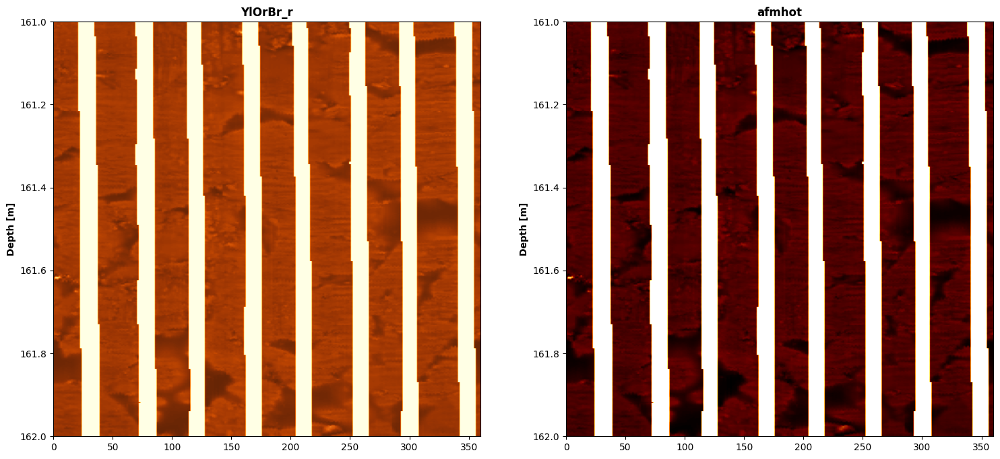

In [18]:
# Test different color schemes for image data
plt.figure(figsize=(18, 8))
plt.subplot(121)
plt.imshow(well_images["well_A"].iloc[23500:24000], extent=[0, 360, 162.0, 161.0], cmap='YlOrBr_r', aspect='auto')
plt.title('YlOrBr_r', weight="bold")
plt.ylabel("Depth [m]", weight="bold")
plt.axis([0, 360, 162, 161])
plt.subplot(122)
plt.imshow(well_images["well_A"].iloc[23500:24000], extent=[0, 360, 162.0, 161.0], cmap='afmhot', aspect='auto')
plt.title('afmhot', weight="bold")
plt.ylabel("Depth [m]", weight="bold")
plt.axis([0, 360, 162, 161])
plt.show()

Maximizing the contrast between high and low resistivity points is crucial. Let's attempt to convert the static images into dynamic ones for better visualization.

### 修改

In [53]:
# This function will take a static image (dataframe) as an input and return a dynamic image (dataframe)
def static2dynamic(image_data):
    q3 = np.nanquantile(image_data[image_data < 255.0], 0.03)
    q97 = np.nanquantile(image_data[image_data < 255.0], 0.97)
    image_data_dynamic = image_data.apply(lambda x: 255 * (x - q3) / (q97 - q3))
    image_data_dynamic[image_data_dynamic < 0] = 0
    image_data_dynamic[image_data_dynamic > 255] = 255
    return image_data_dynamic

In [62]:
import math

def dynamic_image_processing(image_data, min_window_size=10, window_ratio=0.1, overlap_ratio=0.7):
    image_data = image_data.values  # 将 DataFrame 转换为 numpy 数组
    height, width = image_data.shape
    # 自适应计算window_size和step_size
    window_size = max(min_window_size, int(height * window_ratio))
    if window_size > height:
        window_size = height
    step_size = int(window_size * (1 - overlap_ratio))
    if step_size < 1:
        step_size = 1
    # 初始化动态图像数组
    dynamic_image = np.zeros_like(image_data)
    i = 0
    while i < height:
        window_start = i
        window_end = i + window_size
        if window_end > height:
            window_end = height
        current_window_size = window_end - window_start
        window = image_data[window_start:window_end, :]
        dynamic_window = static2dynamic(pd.DataFrame(window)).values  # 将 DataFrame 转换为 numpy 数组
        # 处理窗口间的重叠部分
        if i > 0:
            overlap_start = i - step_size
            if overlap_start < 0:
                overlap_start = 0
            overlap_end = i
            available_overlap = overlap_end - overlap_start
            overlap_size = min(step_size, current_window_size, available_overlap)
            if overlap_size > 0:
                # 生成高斯权重
                sigma = overlap_size / 6  # 标准差，调整以改变曲线形状
                gaussian_weights = [math.exp(-((j - overlap_size/2)**2)/(2*sigma**2)) for j in range(overlap_size)]
                gaussian_weights = np.array(gaussian_weights)
                gaussian_weights /= gaussian_weights.sum()
                for j in range(overlap_size):
                    weight = gaussian_weights[j]
                    dynamic_image[overlap_start + j, :] = (1 - weight) * dynamic_image[overlap_start + j, :] + weight * dynamic_window[j, :]
        # 将动态化后的窗口赋值给动态图像
        dynamic_image[window_start:window_end, :] = dynamic_window
        # 移动步长
        i += step_size
    return dynamic_image

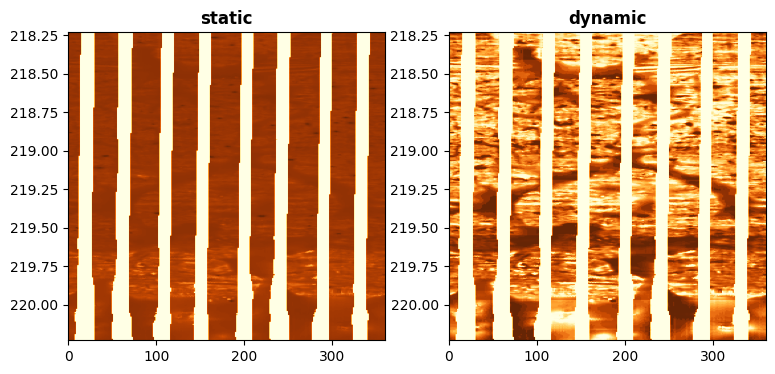

In [63]:
# A comparison example of static and dynamic images
image_data = well_images['well_D'].iloc[76115:77115]
image_data_dynamic = dynamic_image_processing(image_data)

plt.figure(figsize=(9,4))
plt.subplot(121) # static
plt.imshow(image_data, extent=[0, 360, 220.23, 218.23], cmap='YlOrBr_r', aspect='auto')
plt.title("static", weight="bold")
plt.subplot(122) # dynamic
plt.imshow(image_data_dynamic, extent=[0, 360, 220.23, 218.23], cmap='YlOrBr_r', aspect='auto')
plt.title("dynamic", weight="bold")
plt.show()

In [73]:
import torchvision.transforms as transforms
from PIL import Image
import cv2
# 定义增强变换
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomRotation(degrees=15),
    transforms.ToTensor(),
])

# 加载图像
image = image_data_dynamic
image_pil = Image.fromarray(image)
# 如果图像模式不是 "RGB"，则转换为 "RGB"
if image_pil.mode != "RGB":
    image_pil = image_pil.convert("RGB")
# 应用增强
augmented_image = transform(image_pil)

# 将 Tensor 转换回 PIL 图像
to_pil = transforms.ToPILImage()
augmented_image_pil = to_pil(augmented_image)

# 显示或保存增强后的图像
augmented_image_pil.show()  # 显示图像
augmented_image_pil.save('augmented_image.jpg')  # 保存图像

Let's create .jpg files with and without fracture lines

0_fracture_well_A_at_116.058m.jpg


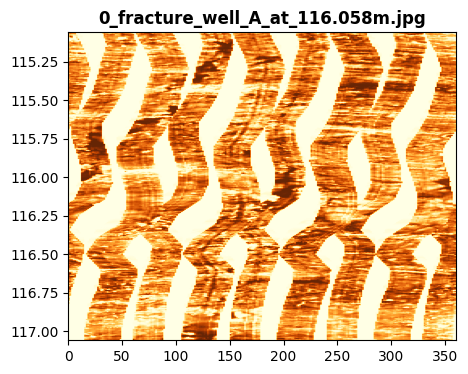

1_fracture_well_A_at_135.0581m.jpg


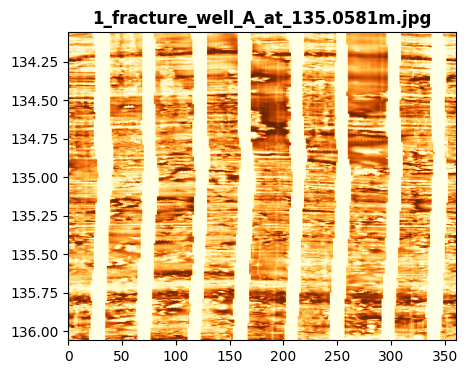

2_fracture_well_A_at_139.1479m.jpg


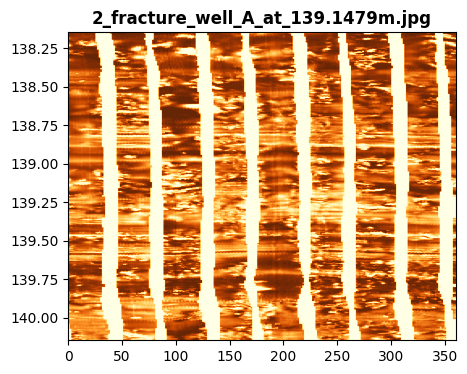

3_fracture_well_A_at_140.8838m.jpg


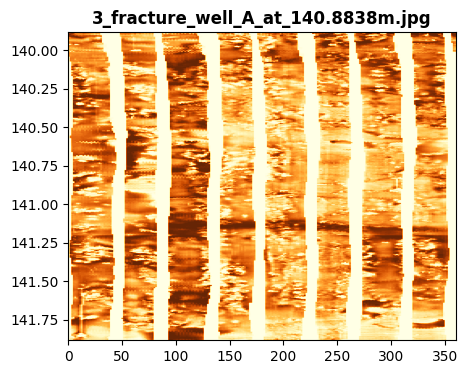

4_fracture_well_A_at_143.2967m.jpg


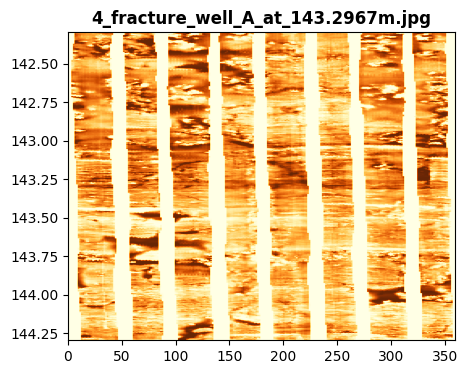

5_fracture_well_A_at_144.4102m.jpg


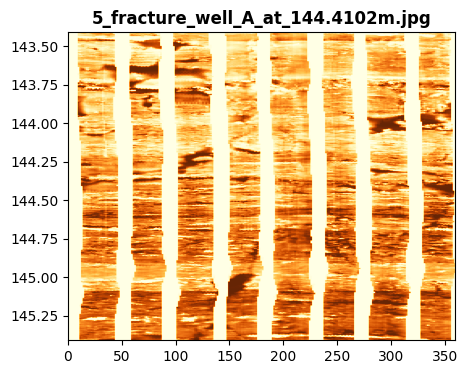

6_fracture_well_A_at_145.2709m.jpg


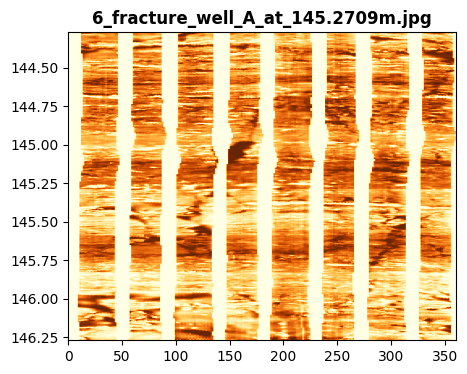

7_fracture_well_A_at_145.722m.jpg


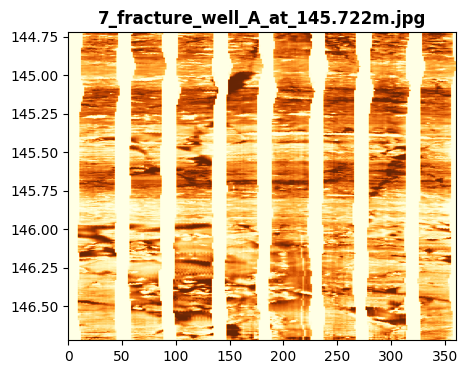

8_fracture_well_A_at_146.4736m.jpg


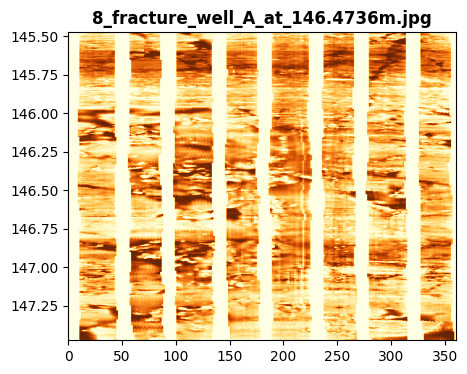

9_fracture_well_A_at_146.7914m.jpg


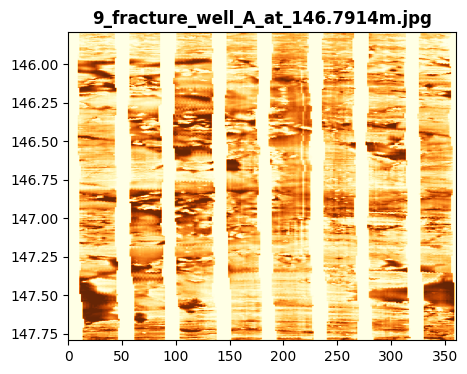

10_fracture_well_A_at_147.9275m.jpg


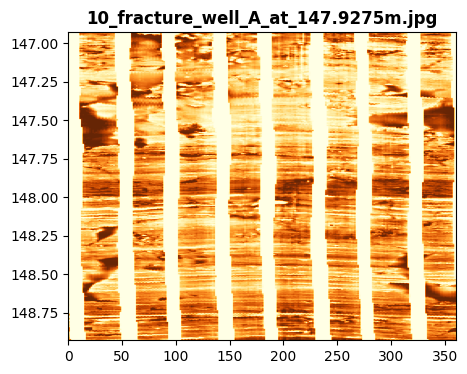

11_fracture_well_A_at_147.8776m.jpg


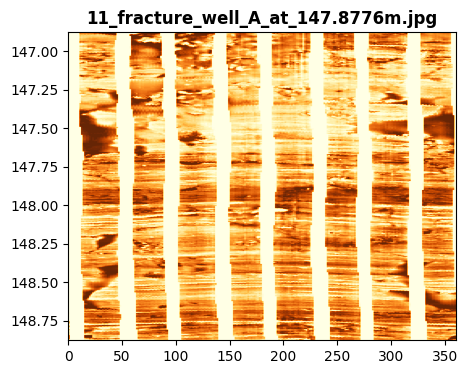

12_fracture_well_A_at_148.1467m.jpg


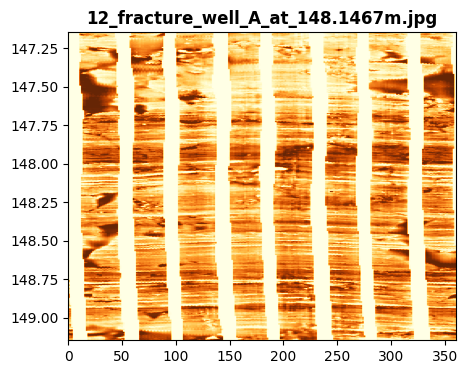

13_fracture_well_A_at_148.5625m.jpg


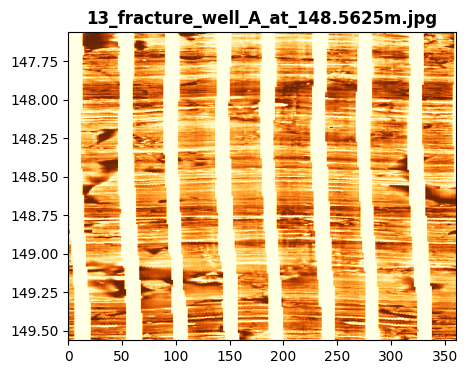

14_fracture_well_A_at_149.9055m.jpg


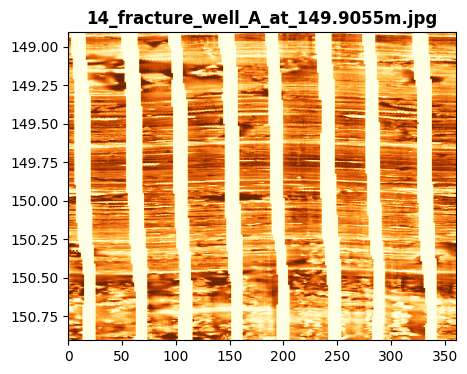

15_fracture_well_A_at_157.447m.jpg


In [ ]:
# Create jpg files from fracture images

for i in range(len(frac)):

    well = frac.Well.iloc[i]
    md = frac.Depth.iloc[i]
    ang = frac.ADIPnew.iloc[i]
    azi = frac.AAZInew.iloc[i]
    title = str(i) + "_fracture_well_" + well + "_at_" + str(md) + "m.jpg"

    amplitude = 0.5 * 8.5 * 0.0254 * np.tan(np.radians(ang))  # 8.5 in diameter borehole, convert from inch to meter
    top_depth = md - 1.0
    bot_depth = md + 1.0
    well_name = "well_" + well
    print(title)

    idx_top = (np.abs(well_images[well_name].index - top_depth)).argmin()
    idx_bot = (np.abs(well_images[well_name].index - bot_depth)).argmin()
    image_data = well_images[well_name].iloc[idx_top:idx_bot]

    # Convert static to dynamic image in order to maximize contrast between black and white
    image_data_dynamic = dynamic_image_processing(image_data)
    y_values = amplitude * np.cos((2 * np.pi * (x_values - azi	- 0)) / 360) + md + 0

    plt.figure(figsize=(5,4))
    # plt.figure(figsize=(5,4))
#     plt.subplot(121) # Without fracture line
    plt.imshow(image_data_dynamic, extent=[0, 360, bot_depth, top_depth], cmap='YlOrBr_r', aspect='auto')
    plt.title(title, weight="bold")
#     plt.ylabel("Depth [m]", weight="bold")
    plt.axis([0, 360, bot_depth, top_depth])
#     plt.subplot(122) # With fracture line
#     plt.imshow(image_data_dynamic, extent=[0, 360, bot_depth, top_depth], cmap=cm_default, aspect='auto')
#     plt.plot(x_values, y_values, color='m', linewidth=4, linestyle='dashed')
#     plt.title(title, weight="bold")
#     plt.axis([0, 360, bot_depth, top_depth])
    plt.savefig('./data/images/train/' + title, dpi=300)
    plt.show()
    plt.close()


## <a>6. Build Machine Learning Models</a>






In [19]:
DATA_DIR = './data/'

In [25]:
!pip install ultralytics==8.3.2

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simpl


  Could not find a version that satisfies the requirement ultralytics==8.3.2 (from versions: )
No matching distribution found for ultralytics==8.3.2


In [20]:
import os
from ultralytics import YOLO
import torch
import gc
gc.collect()
torch.cuda.empty_cache()

## **Note:**
**By default, participants will use the provided pretrained weights and configuration (both available in the folder). You can skip the cell below by commenting it out and proceed.**

**If you choose to retrain the model, it's highly recommended to use a GPU or TPU, as this will greatly reduce training time.**

In [21]:
# Be noted that there are a couple of different models (nano(n), small(s), medium(m), large(l), and extra large(x))

model = YOLO('./yolov8n-seg.pt')  # load a pretrained model (recommended for training)
model.train(data ='./config.yaml', epochs = 200, imgsz = 640,amp=False,)

print("Training completed...")

New https://pypi.org/project/ultralytics/8.3.36 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.2  Python-3.9.20 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
engine\trainer: task=segment, mode=train, model=./yolov8n-seg.pt, data=./config.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train14, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=False, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save

train: Scanning D:\ml\Machine-Learning-Competition-2024\fracture_identification\data\labels\train.cache... 94 images, 2
val: Scanning D:\ml\Machine-Learning-Competition-2024\fracture_identification\data\labels\val.cache... 20 images, 1 bac


Plotting labels to runs\segment\train14\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 72 weight(decay=0.0), 83 weight(decay=0.0005), 82 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\segment\train14
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/200      5.21G      3.349      5.851      3.981      3.022         22        640: 100%|██████████| 8/8 [00:23<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56    0.00317      0.357    0.00568    0.00141          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/200      5.25G      2.542      4.676      3.355      2.123         11        640: 100%|██████████| 8/8 [00:14<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56    0.00397      0.446     0.0216     0.0066          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/200      5.22G      2.179        4.3      3.102      1.705          5        640: 100%|██████████| 8/8 [00:14<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56    0.00492      0.554     0.0786     0.0254          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/200      5.24G      1.902      4.132      2.844      1.589         12        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56    0.00587      0.661      0.285     0.0817          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/200      5.26G      1.911      3.981      2.705      1.588         12        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56    0.00444        0.5      0.138      0.061          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/200      4.78G      1.973      4.147      2.802      1.722         14        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0054      0.607      0.209     0.0777          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/200       5.3G      1.987      3.926      2.552      1.702         14        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56    0.00683      0.768      0.214      0.077          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/200       5.3G      1.941      4.096      2.696       1.66          8        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0081      0.911      0.138     0.0477          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/200      5.26G      1.948      4.111      2.606      1.685         13        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0382      0.464      0.115     0.0366          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/200      5.29G      1.783      3.983      2.456      1.596         17        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.181      0.143      0.112     0.0398          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/200      5.29G      1.916      4.077      2.434      1.636         13        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0963      0.429     0.0633     0.0274          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/200      5.26G      1.849      3.774      2.357      1.598         10        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.191      0.196      0.112     0.0461          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/200      4.76G      1.927      4.025       2.38      1.685          9        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56        0.2      0.429      0.159     0.0578          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/200      4.79G      1.906      3.867      2.257      1.678         16        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.205      0.536      0.152     0.0592          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/200       4.8G      1.766      3.824      2.345      1.554          5        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.234      0.339      0.177     0.0796          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/200      4.79G       1.93      3.894      2.286      1.681         14        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.38      0.405      0.298      0.122          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/200      5.25G      1.833      4.073      2.363      1.635          9        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.261        0.5      0.251     0.0774   0.000159     0.0179   9.82e-05   9.82e-06



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/200      5.32G      1.873      3.879      2.295      1.608          8        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.298      0.446      0.266     0.0788   0.000159     0.0179   8.68e-05   8.68e-06



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/200      5.26G      1.766      3.698       2.18      1.546         10        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.384      0.429      0.305      0.081   0.000159     0.0179   8.74e-05   1.75e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/200      5.32G      1.766      3.748      2.212      1.572         17        640: 100%|██████████| 8/8 [00:14<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.247      0.393      0.219     0.0725   0.000159     0.0179   8.25e-05   8.25e-06



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/200      4.82G      1.741      3.745      2.269      1.602          4        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.33      0.214      0.205      0.065          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/200      5.26G      1.789      3.701      2.141      1.574          8        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.236      0.375      0.239     0.0975   0.000159     0.0179   8.09e-05   2.43e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/200      4.77G      1.826      3.708      2.184      1.665         11        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.473      0.498      0.455      0.157   0.000317     0.0357   0.000235   2.35e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/200      5.28G      1.707      3.726      2.125      1.538         12        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.262      0.411      0.252     0.0928   0.000159     0.0179   8.24e-05   8.24e-06



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/200      4.77G      1.804      3.779       2.12      1.602         11        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.278      0.232      0.202      0.114   0.000159     0.0179   8.28e-05   1.66e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/200      4.76G      1.622      3.704       1.99      1.503         19        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.216      0.304      0.234     0.0921          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/200      5.25G      1.695      3.685      1.981      1.514         11        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.356      0.286       0.24     0.0913   0.000477     0.0536   0.000454    7.5e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/200       4.8G      1.619      3.724      2.122       1.48         12        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.225      0.286      0.239     0.0931    0.00023     0.0179   0.000142   7.08e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/200      5.29G      1.665      3.756      2.024      1.505         12        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.225      0.411      0.167     0.0578          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/200      4.83G       1.61      3.591      1.923       1.44         10        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.246      0.455      0.196     0.0826   0.000372     0.0179   0.000196   1.96e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/200      5.26G      1.664      3.719      1.928      1.456          6        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.244      0.232      0.206     0.0631     0.0026     0.0179   0.000197   1.97e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/200      4.78G      1.735      3.572      1.925      1.531          7        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.325      0.286      0.256     0.0896          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/200      5.27G      1.605      3.647        1.9      1.436          8        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.498      0.301       0.35      0.107          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/200      5.26G      1.533       3.48      1.817      1.426          8        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.236      0.375      0.208     0.0931          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/200      5.29G      1.597      3.786      1.986      1.379          6        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.405      0.375      0.302      0.144          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/200      5.27G      1.588      3.599      1.953      1.438         15        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.462      0.304       0.33      0.133          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/200      4.81G      1.587      3.527      1.889      1.403          9        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.324      0.339       0.24     0.0871          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/200       4.8G      1.548      3.517       1.85      1.394         10        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.148      0.286     0.0813     0.0272          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/200      5.22G      1.527      3.508      1.768      1.379         24        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0629     0.0357     0.0304      0.011          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/200      4.76G      1.593      3.519      1.822      1.439         16        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.541     0.0179     0.0211     0.0124          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/200      4.81G      1.515      3.535      1.791      1.372         12        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.284       0.12     0.0909     0.0394          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/200      4.88G       1.57      3.412      1.938      1.449          4        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.293      0.268      0.185     0.0809          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/200      4.79G      1.513      3.494      1.729       1.36          8        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.432      0.421       0.41      0.161          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/200      5.22G       1.59      3.573      1.881      1.412         10        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.362      0.429      0.351      0.125          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/200      5.25G      1.479      3.404      1.831      1.369          9        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.304      0.477      0.302      0.106          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/200      4.81G      1.508      3.539      1.865      1.409          7        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.306      0.339      0.226     0.0978          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/200      4.83G      1.575      3.449      1.789      1.419         12        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.26      0.339      0.227     0.0958          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/200       4.8G      1.438      3.387      1.616       1.33          7        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.247       0.25      0.177     0.0661          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/200      5.26G       1.56      3.491      1.763      1.396         15        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0769     0.0714     0.0654     0.0303    0.00102     0.0357   0.000577   8.44e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/200      4.76G      1.445      3.331       1.73      1.307         16        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.357      0.214      0.177     0.0543   0.000802     0.0357   0.000645   6.45e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/200      5.28G      1.347      3.254      1.597      1.287          9        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.27      0.225      0.269     0.0823          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/200      4.78G      1.435      3.317      1.685      1.322          7        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.361      0.232      0.309      0.101          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/200      5.29G      1.357       3.34      1.643      1.313         10        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.243      0.217      0.261     0.0983          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/200      4.79G      1.487      3.429      1.681      1.355         17        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.221      0.393      0.207     0.0711     0.0101     0.0179   0.000568   5.68e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/200      4.74G      1.457      3.261      1.624      1.375         15        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.27      0.393      0.244     0.0727          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/200      4.76G      1.411      3.374      1.566      1.314         12        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.289      0.247      0.276     0.0912          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/200      4.79G       1.39      3.221      1.473      1.354         16        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.398      0.125      0.274     0.0993   0.000798     0.0179   0.000419   8.36e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/200       4.8G      1.328      3.028      1.519      1.268         10        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.583      0.161      0.268     0.0838          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/200      5.31G      1.382       3.25      1.603      1.346          7        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.325      0.125      0.193     0.0791    0.00145     0.0357   0.000759   7.59e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/200       4.8G      1.368      3.149      1.504      1.327          9        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.354      0.147      0.218     0.0809          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/200      5.28G       1.39       3.14      1.596       1.32         12        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.251     0.0893      0.191     0.0738          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/200      5.26G      1.502       3.35      1.827      1.367          3        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.444      0.232      0.248     0.0689          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/200      5.27G      1.455      3.227      1.721      1.448          4        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.471      0.232      0.263     0.0768          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/200      4.83G      1.357       3.23      1.501      1.306         13        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.512      0.187      0.273     0.0872          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/200      4.79G      1.348      3.128      1.532      1.284          8        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.427      0.107      0.258     0.0797          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/200      4.83G      1.391      3.216      1.521      1.296         17        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.676      0.232       0.41      0.154          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/200      5.24G      1.378      3.203      1.565      1.317         17        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.721      0.107      0.274     0.0799          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/200      5.24G      1.305      3.108      1.554      1.267          8        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.26     0.0566     0.0598     0.0153   0.000439     0.0179   0.000228   4.55e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/200      4.83G      1.281      3.048      1.467      1.288         11        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.314     0.0714     0.0545     0.0117          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/200      4.76G      1.319      2.941      1.422      1.278         18        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0228      0.321     0.0467     0.0116          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/200      5.22G      1.244      3.035      1.352      1.242         10        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.309     0.0357      0.082     0.0259          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/200      4.82G      1.226      2.967       1.36      1.246         16        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.15     0.0357      0.046     0.0188          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/200      5.26G       1.41      3.062      1.538      1.341          6        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0572      0.375     0.0719     0.0262          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/200      5.31G      1.262      2.993      1.414      1.227          9        640: 100%|██████████| 8/8 [00:14<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.124      0.625      0.187     0.0642          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/200      4.84G      1.262      3.076      1.469      1.198          5        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.512      0.143      0.264     0.0839          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/200      5.23G      1.236       2.95      1.367      1.234          6        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.353      0.161      0.135     0.0446          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/200      5.24G      1.293      2.976      1.482      1.251          8        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.276      0.125     0.0935     0.0265          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/200      5.32G      1.269      3.051      1.324      1.251         13        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.222     0.0893     0.0694     0.0224          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/200       5.3G      1.235      2.978      1.302      1.205         14        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.276      0.107      0.127     0.0443          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/200      4.76G      1.274      2.946      1.414      1.244         11        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.225      0.161      0.177     0.0647    0.00118     0.0179   0.000661   6.61e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/200      5.24G      1.278      2.866      1.365      1.233         10        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.388      0.107      0.141     0.0478   0.000687     0.0179   0.000439    7.9e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/200      5.26G      1.279      2.776      1.367       1.26          3        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.181     0.0893     0.0731     0.0234   0.000673     0.0179   0.000645   6.45e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/200       4.8G      1.256       3.01      1.344      1.253          9        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.205      0.107     0.0784     0.0276     0.0011     0.0179   0.000583   5.83e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/200      5.27G      1.258      2.965      1.292      1.267          9        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.251      0.179      0.166     0.0657    0.00131     0.0179   0.000681   0.000136



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/200      4.79G      1.341      3.118      1.386      1.254         10        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.392      0.288      0.228     0.0845          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/200      4.82G      1.146       2.87      1.231      1.151          6        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.226      0.161       0.17     0.0598          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/200      4.78G      1.178      2.862      1.209      1.186         14        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0492      0.429     0.0601     0.0216          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/200      5.24G      1.226      2.793       1.21      1.203         10        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0289     0.0357     0.0222     0.0068          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/200      4.76G      1.208      2.753      1.387      1.189          3        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0322      0.179     0.0283    0.00714          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/200      4.75G      1.243      2.891      1.292      1.218         10        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0631      0.357     0.0935     0.0266          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/200      5.27G      1.307      2.776      1.366      1.237          3        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.406      0.161      0.199     0.0714          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/200      4.81G      1.172      2.791      1.196      1.217          4        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.356      0.268      0.315      0.105          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/200      5.33G      1.094      2.746      1.202        1.2          8        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.408      0.308       0.35     0.0932          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/200      5.26G      1.295      2.832      1.287      1.279          6        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.449      0.204      0.303     0.0914          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/200      5.28G      1.138        2.8      1.184      1.167          4        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0714      0.286     0.0891     0.0333          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/200      5.26G      1.172      2.748      1.194      1.168         20        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.938     0.0179      0.028     0.0106          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/200      5.23G      1.132      2.565      1.174      1.138         15        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.643     0.0357     0.0502     0.0153          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/200      5.26G      1.151      2.758      1.267      1.198          7        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.645     0.0334     0.0498     0.0131          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/200      5.26G      1.137      2.641      1.158      1.172         13        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.27     0.0179     0.0133    0.00674          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/200      4.81G      1.204      2.754      1.191      1.201          9        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56    0.00709     0.0714    0.00736    0.00191          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    101/200      5.28G      1.115      2.665      1.183      1.169         10        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0179      0.125     0.0147    0.00252          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    102/200      5.23G      1.165      2.688      1.188      1.204         10        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0789      0.321      0.123     0.0391          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    103/200      5.22G      1.103      2.589      1.109      1.155         10        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.103      0.429      0.188     0.0657          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    104/200      4.85G      1.107      2.504      1.061       1.11          7        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.102      0.411      0.114     0.0394          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    105/200      4.83G      1.095      2.511       1.11      1.139         11        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0759      0.321      0.133     0.0281          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    106/200      5.26G      1.195      2.559      1.183      1.165         17        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.049      0.304     0.0551     0.0137          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    107/200      5.23G      1.116       2.74      1.128       1.21         11        640: 100%|██████████| 8/8 [00:13<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.013     0.0893    0.00727    0.00114          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    108/200      4.83G       1.15      2.583      1.121      1.174          9        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56    0.00952     0.0536    0.00506     0.0015          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    109/200      4.81G      1.143      2.739      1.224      1.168          8        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0118     0.0714    0.00905     0.0031          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    110/200      5.24G       1.05      2.551       1.17      1.153          6        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.145     0.0357     0.0312    0.00947    0.00171     0.0179   0.000896   8.96e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    111/200      5.23G      1.064      2.534      1.125      1.194         11        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0531      0.589      0.117     0.0259    0.00161     0.0179    0.00118   0.000118



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    112/200      5.28G      1.093      2.486       1.07      1.178         18        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.38       0.25       0.24     0.0837    0.00219     0.0179    0.00119   0.000119



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    113/200      4.74G      1.115      2.548      1.122      1.196          8        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.534      0.246      0.349      0.122      0.003     0.0179    0.00186   0.000186



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    114/200       4.8G      1.086      2.581      1.106      1.167          6        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.643      0.268       0.35      0.117    0.00565     0.0357    0.00344   0.000344



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    115/200       4.8G      1.092      2.567      1.116      1.211         10        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.464      0.321      0.273      0.102    0.00567     0.0357    0.00354   0.000724



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    116/200      5.24G      1.086      2.379      1.079      1.133          5        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.574      0.196      0.291      0.109    0.00649     0.0357    0.00396      0.001



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    117/200       4.8G      1.106      2.526       1.17      1.194          9        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.748      0.159      0.329      0.123    0.00551     0.0357    0.00396    0.00101



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    118/200      4.76G      1.094      2.399      1.172      1.153          4        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56       0.66      0.107      0.322      0.118    0.00422     0.0357    0.00407    0.00104



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    119/200      5.29G      1.022       2.42      1.023      1.099         13        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.596      0.107      0.197     0.0774    0.00334     0.0357    0.00215   0.000645



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    120/200      5.21G     0.9935      2.502      1.045      1.164          9        640: 100%|██████████| 8/8 [00:11<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.583     0.0893      0.103     0.0357          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    121/200      4.82G      1.052      2.424      1.078      1.162          3        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0305      0.268     0.0843     0.0237          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    122/200      5.33G      1.021      2.511      1.024       1.13          9        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56     0.0438      0.339     0.0932     0.0318          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    123/200      5.24G      1.088      2.427      1.033      1.144         12        640: 100%|██████████| 8/8 [00:12<0
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP

                   all         21         56      0.266     0.0584      0.102     0.0289          0          0          0          0
EarlyStopping: Training stopped early as no improvement observed in last 100 epochs. Best results observed at epoch 23, best model saved as best.pt.
To update EarlyStopping(patience=100) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



123 epochs completed in 0.499 hours.
Optimizer stripped from runs\segment\train14\weights\last.pt, 6.2MB
Optimizer stripped from runs\segment\train14\weights\best.pt, 6.2MB

Validating runs\segment\train14\weights\best.pt...
Ultralytics 8.3.2  Python-3.9.20 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
YOLOv8n-seg summary (fused): 213 layers, 2,936,979 parameters, 0 gradients, 10.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all         21         56      0.473      0.496      0.455      0.157   0.000317     0.0357   0.000254   2.54e-05
Speed: 1.6ms preprocess, 13.5ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs\segment\train14
Training completed...


In [22]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
# !rm -rf /content/runs # if an error comes up below, remove "runs" directory first
# !scp -r ./runs './fracture_identification'


### **Validation**


Let's review the training results. The figures below show loss, precision, and recall as functions of iterations. Note that the training only runs for about 200 epoch iterations, and performance can be improved with extended training. Additionally, previous studies have shown that small, medium, or larger models outperform the nano model, though they require more training time and computational resources.

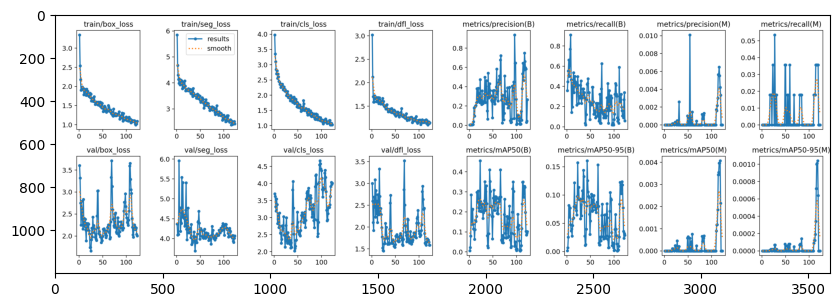

In [23]:
# Read images
import cv2
# from google.colab.patches import cv2_imshow

train_results = cv2.imread("./runs/segment/train14/results.png")
train_results
# OpenCV读取的图像是BGR格式，需要转换为RGB格式以正确显示颜色
train_results_rgb = cv2.cvtColor(train_results, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))
plt.imshow(train_results_rgb)


The figures below compare the validation fracture labels with the corresponding predictions and their confidence levels. Some fractures are accurately predicted, while others have low-confidence predictions and are not correctly identified.

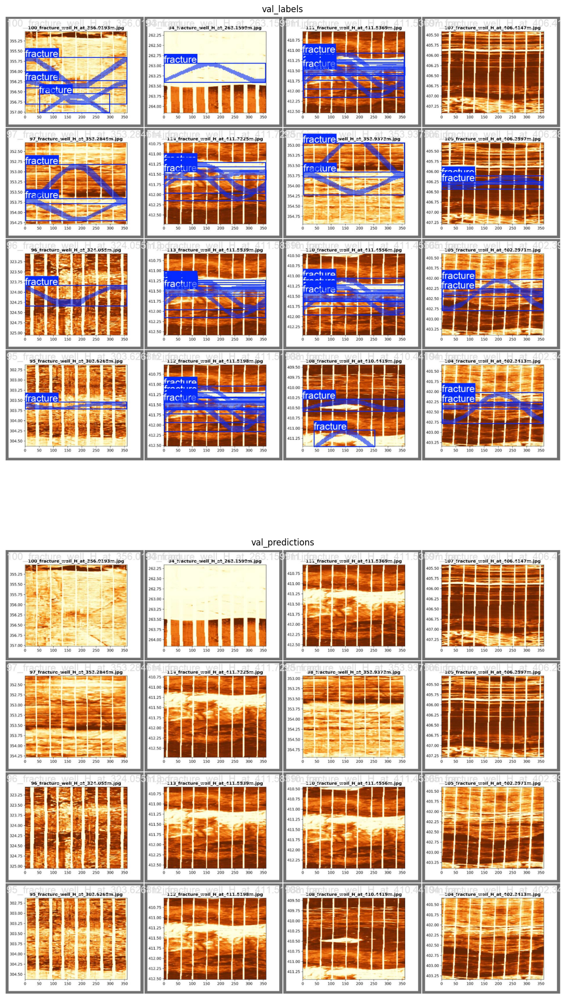

In [32]:
import cv2
import matplotlib.pyplot as plt
# from google.colab.patches import cv2_imshow

# Read images
val_labels = cv2.imread('./runs/segment/train6/val_batch0_labels.jpg')
val_predictions = cv2.imread('./runs/segment/train6/val_batch0_pred.jpg')

plt.figure(figsize=(30, 25))
plt.subplot(211)
plt.imshow(cv2.cvtColor(val_labels, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("val_labels")
plt.subplot(212)
plt.imshow(cv2.cvtColor(val_predictions, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("val_predictions")
plt.show()

In [24]:
# Check validation results
# model_path = '/content/gdrive/My Drive/fracture_identification/run/segment/train/weights/last.pt' # weights from last iteration
model_path = './runs/segment/train14/weights/best.pt' # best weights during the iteration
image_path = './data/images/val/103_fracture_well_H_at_358.6637m.jpg'

img = cv2.imread(image_path)
H, W, _ = img.shape

model = YOLO(model_path)
results = model(img)

for result in results:
    for j, mask in enumerate(result.masks.data):
        
        mask = mask.cpu()
        
        mask = mask.numpy() * 255

        mask = cv2.resize(mask, (W, H))
        cv2.imwrite('./103_fracture_well_H_at_358.6637m_predict.jpg', mask)




0: 512x640 (no detections), 129.1ms
Speed: 6.7ms preprocess, 129.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)


AttributeError: 'NoneType' object has no attribute 'data'

In [25]:
# A function to draw rectangles in the image
import matplotlib.patches as patches

def draw_rect_box(pred_ndarray, depth):
    """
    pred_ndarray: ndarray with a shape of (1200, 1500, 3)
    depth: depth of image (float)
    return: rectangle shape
    """
    x1 = np.min(np.nonzero(pred_ndarray[:,:,1])[1])
    y1 = np.min(np.nonzero(pred_ndarray[:,:,1])[0])
    x_width = np.max(np.nonzero(pred_ndarray[:,:,1])[1]) - np.min(np.nonzero(pred_ndarray[:,:,1])[1])
    y_height = np.max(np.nonzero(pred_ndarray[:,:,1])[0]) - np.min(np.nonzero(pred_ndarray[:,:,1])[0])

    rect0 = patches.Rectangle((200, 143), 1157, 922, linewidth=2, edgecolor='b', facecolor='none')
    rect1 = patches.Rectangle((x1, y1), x_width, y_height, linewidth=1, edgecolor='r', facecolor='none')
    frac_depth = 2/922*(np.max(np.nonzero(pred_ndarray[:,:,1])[0]) + np.min(np.nonzero(pred_ndarray[:,:,1])[0])) / 2 - 1.3102

    return rect0, rect1, frac_depth


In [26]:
# Detection example
val_img = cv2.imread('./frac_data/images_with_fracture_lines/103_fracture_well_H_at_358.6637m.jpg')
val_pred = cv2.imread('./103_fracture_well_H_at_358.6637m_predict.jpg')

# fig, axs = plt.subplots(1, 2, figsize=(15, 35))
# axs[0].imshow(cv2.cvtColor(val_img, cv2.COLOR_BGR2RGB))
# axs[0].set_title('Original Image')
# axs[0].axis('off')
# axs[1].imshow(cv2.cvtColor(val_pred, cv2.COLOR_BGR2RGB))
rect0, rect1, frac_depth = draw_rect_box(val_pred, depth=358.6637)
# axs[1].add_patch(rect0)
# axs[1].add_patch(rect1)
# axs[1].axis('off')
# axs[1].set_title('Fracture Detection with Rectangle')

print("Answer depth of fracture is", frac.Depth.iloc[103])
print("Predicted depth of fracture is", 358.6637-frac_depth)


Answer depth of fracture is 358.6637
Predicted depth of fracture is 358.68214295010847


In [27]:
val_pred.shape

(1200, 1500, 3)

In object detection, evaluation can be made with various metrics: mAP (mean Average Precision), IoU (Intersection over union) which measures the overlap between 2 boundaries, AP (Average Precision) indicating the area under the precision-recall curve, or combinations of above.

In our case, which is fracture identification, we will consider F1 score incorporating both recall and precision.

In [28]:
# Validate the model on your test dataset
metrics_val = model.val(data="./config.yaml")
mp_val, mr_val, map50_val, map_val = metrics_val.box.mean_results()
F1_val = 2 * (mp_val * mr_val) / (mp_val + mr_val)

print("==========================================================")
print("Validation results are ===================================")
print("Mean precision is ", mp_val)
print("Mean recall is ", mr_val)
print("Mean AP at IoU threshold of 0.5 is ", map50_val)
print("Mean AP at IoU thresholds from 0.5 to 0.95 is ", map_val)
print("Mean F1 score is ", F1_val)
print("==========================================================")

Ultralytics 8.3.2  Python-3.9.20 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)


val: Scanning D:\ml\Machine-Learning-Competition-2024\fracture_identification\data\labels\val.cache... 20 images, 1 bac
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP


                   all         21         56      0.473      0.496      0.455      0.157   0.000317     0.0357   0.000254   2.54e-05
Speed: 4.6ms preprocess, 30.1ms inference, 0.0ms loss, 6.1ms postprocess per image
Results saved to runs\segment\val26
Validation results are ===================================
Mean precision is  0.4727780874539965
Mean recall is  0.4964554235412305
Mean AP at IoU threshold of 0.5 is  0.4553125788839015
Mean AP at IoU thresholds from 0.5 to 0.95 is  0.15663012696706588
Mean F1 score is  0.4843275495230841


As anticipated, our score is relatively low due to several factors, including: (1) insufficient epoch length, (2) use of default hyperparameters, (3) lack of shuffling in the training and validation datasets, (4) possible insufficiency of the YOLO Nano model's complexity, (5) limited size of the training dataset, (6) potential improvements in input data processing, and (7) various other reasons. For actionable steps to enhance performance, refer to the "8. Discussion" section, where we highlight some quick wins.

In [29]:
# Calculate number of images for test wells using 2 m interval and 1 m overlap
print("Image log depth interval of T1 well is", well_images["well_T1"].index[-1] - well_images["well_T1"].index[0], "m")
print("Image log depth interval of T2 well is", well_images["well_T2"].index[-1] - well_images["well_T2"].index[0], "m")

T1_well_image_number = int(np.floor(well_images["well_T1"].shape[0]/500))
T2_well_image_number = int(np.floor(well_images["well_T2"].shape[0]/500))

print("Total", T1_well_image_number, "images need to be captured from Well_T1")
print("Total", T2_well_image_number, "images need to be captured from Well_T2")
# ignore last half meter of image

Image log depth interval of T1 well is 364.592 m
Image log depth interval of T2 well is 423.496 m
Total 364 images need to be captured from Well_T1
Total 423 images need to be captured from Well_T2


In [30]:
# Create jpg files from T1 test wells (2 m intervals, 1 m overlap)

for i in range(T1_well_image_number):

    md = well_images["well_T1"].index[0] + i + 1.0 # depth is at the center of the image
    title = str(i) + "_test_well_T1" + "_at_" + str(md) + "m.jpg"

    top_depth = md - 1.0
    bot_depth = md + 1.0
    well_name = "well_T1"
    print(title)

    idx_top = i*500
    idx_bot = idx_top + 1000
    image_data = well_images[well_name].iloc[idx_top:idx_bot]

    # Convert static to dynamic image in order to maximize contrast between black and white
    image_data_dynamic = dynamic_image_processing(image_data)

    plt.figure(figsize=(5,4))
    plt.imshow(image_data_dynamic, extent=[0, 360, bot_depth, top_depth], cmap='YlOrBr_r', aspect='auto')
    plt.title(title, weight="bold")
    plt.ylabel("Depth [m]", weight="bold")
    plt.axis([0, 360, bot_depth, top_depth])
    plt.savefig('./frac_data/test_images/T1/' + title, dpi=300)
    plt.show()
    plt.close()

0_test_well_T1_at_101.4m.jpg


NameError: name 'dynamic_image_processing' is not defined

In [ ]:
# Create jpg files from T2 test wells (2 m intervals, 1 m overlap)

for i in range(T2_well_image_number):

    md = well_images["well_T2"].index[0] + i + 1.0 # depth is at the center of the image
    title = str(i) + "_test_well_T2" + "_at_" + str(md) + "m.jpg"

    top_depth = md - 1.0
    bot_depth = md + 1.0
    well_name = "well_T2"
    print(title)

    idx_top = i*500
    idx_bot = idx_top + 1000
    image_data = well_images[well_name].iloc[idx_top:idx_bot]

    # Convert static to dynamic image in order to maximize contrast between black and white
    image_data_dynamic = dynamic_image_processing(image_data)

    plt.figure(figsize=(5,4))
    plt.imshow(image_data_dynamic, extent=[0, 360, bot_depth, top_depth], cmap='YlOrBr_r', aspect='auto')
    plt.title(title, weight="bold")
    plt.ylabel("Depth [m]", weight="bold")
    plt.axis([0, 360, bot_depth, top_depth])
    plt.savefig('./frac_data/test_images/T2/' + title, dpi=300)
    plt.show()
    plt.close()

## <a>7. Prediction</a>
### **Predict depths of potential fractures using images from two test wells (T1 and T2)**

In [48]:
# Predict fractures from T1 well images
model_path = './runs/segment/train14/weights/best.pt' # best weights during the iteration
folder_path = './frac_data/test_images/T1'

conf_threshold = 0.3 # Users can adjust this confidence threshold number to identify more or less number of fractures
list_of_frac_depth_T1 = []
list_of_confidence_T1 = []

for filename in os.listdir(folder_path):
    if filename.endswith('.jpg'):
        img_path = os.path.join(folder_path, filename)
        depth = float(filename[-10:-5])
        img = cv2.imread(img_path)
        title = filename[:-4] + "_prediction"

        model = YOLO(model_path)
        results = model.predict(img, save=True, save_txt=True, conf=conf_threshold,
                                project="./frac_data/test_predictions/T1/", name=title)

        print("Predicting ", title)
        for r in results:
            boxes = r.boxes
            for box in boxes:
                frac_depth = depth + 2/922*(float(box.xyxy[0][1]) + float(box.xyxy[0][3])) / 2 - 1.3102
                if float(results[0].boxes.conf[0]) > conf_threshold:
                    list_of_frac_depth_T1.append(frac_depth)
                    list_of_confidence_T1.append(float(results[0].boxes.conf[0]))



0: 512x640 1 fracture, 60.9ms
Speed: 46.9ms preprocess, 60.9ms inference, 67.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\0_test_well_T1_at_101.4m_prediction2
1 label saved to frac_data\test_predictions\T1\0_test_well_T1_at_101.4m_prediction2\labels
Predicting  0_test_well_T1_at_101.4m_prediction

0: 512x640 1 fracture, 29.8ms
Speed: 0.0ms preprocess, 29.8ms inference, 7.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\100_test_well_T1_at_201.4m_prediction2
1 label saved to frac_data\test_predictions\T1\100_test_well_T1_at_201.4m_prediction2\labels
Predicting  100_test_well_T1_at_201.4m_prediction

0: 512x640 2 fractures, 13.4ms
Speed: 3.0ms preprocess, 13.4ms inference, 31.4ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\101_test_well_T1_at_202.4m_prediction2
1 label saved to frac_data\test_predictions\T1\101_test_well_T1_at_202.4m_

Results saved to frac_data\test_predictions\T1\11_test_well_T1_at_112.4m_prediction2
0 label saved to frac_data\test_predictions\T1\11_test_well_T1_at_112.4m_prediction2\labels
Predicting  11_test_well_T1_at_112.4m_prediction

0: 512x640 (no detections), 23.7ms
Speed: 3.0ms preprocess, 23.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\120_test_well_T1_at_221.4m_prediction2
0 label saved to frac_data\test_predictions\T1\120_test_well_T1_at_221.4m_prediction2\labels
Predicting  120_test_well_T1_at_221.4m_prediction

0: 512x640 3 fractures, 58.8ms
Speed: 4.0ms preprocess, 58.8ms inference, 14.8ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\121_test_well_T1_at_222.4m_prediction2
1 label saved to frac_data\test_predictions\T1\121_test_well_T1_at_222.4m_prediction2\labels
Predicting  121_test_well_T1_at_222.4m_prediction

0: 512x640 (no detections), 41.7ms
Speed: 4.0ms prep

Predicting  13_test_well_T1_at_114.4m_prediction

0: 512x640 4 fractures, 73.6ms
Speed: 9.4ms preprocess, 73.6ms inference, 16.1ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\140_test_well_T1_at_241.4m_prediction2
1 label saved to frac_data\test_predictions\T1\140_test_well_T1_at_241.4m_prediction2\labels
Predicting  140_test_well_T1_at_241.4m_prediction

0: 512x640 (no detections), 13.9ms
Speed: 3.0ms preprocess, 13.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\141_test_well_T1_at_242.4m_prediction2
0 label saved to frac_data\test_predictions\T1\141_test_well_T1_at_242.4m_prediction2\labels
Predicting  141_test_well_T1_at_242.4m_prediction

0: 512x640 (no detections), 25.8ms
Speed: 3.0ms preprocess, 25.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\142_test_well_T1_at_243.4m_prediction2
0 label sav

Speed: 4.0ms preprocess, 28.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\160_test_well_T1_at_261.4m_prediction2
0 label saved to frac_data\test_predictions\T1\160_test_well_T1_at_261.4m_prediction2\labels
Predicting  160_test_well_T1_at_261.4m_prediction

0: 512x640 (no detections), 79.6ms
Speed: 5.5ms preprocess, 79.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\161_test_well_T1_at_262.4m_prediction2
0 label saved to frac_data\test_predictions\T1\161_test_well_T1_at_262.4m_prediction2\labels
Predicting  161_test_well_T1_at_262.4m_prediction

0: 512x640 (no detections), 21.9ms
Speed: 3.0ms preprocess, 21.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\162_test_well_T1_at_263.4m_prediction2
0 label saved to frac_data\test_predictions\T1\162_test_well_T1_at_263.4m_prediction2\labels


Results saved to frac_data\test_predictions\T1\180_test_well_T1_at_281.4m_prediction2
0 label saved to frac_data\test_predictions\T1\180_test_well_T1_at_281.4m_prediction2\labels
Predicting  180_test_well_T1_at_281.4m_prediction

0: 512x640 (no detections), 23.1ms
Speed: 4.0ms preprocess, 23.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\181_test_well_T1_at_282.4m_prediction2
0 label saved to frac_data\test_predictions\T1\181_test_well_T1_at_282.4m_prediction2\labels
Predicting  181_test_well_T1_at_282.4m_prediction

0: 512x640 (no detections), 25.2ms
Speed: 0.0ms preprocess, 25.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\182_test_well_T1_at_283.4m_prediction2
0 label saved to frac_data\test_predictions\T1\182_test_well_T1_at_283.4m_prediction2\labels
Predicting  182_test_well_T1_at_283.4m_prediction

0: 512x640 3 fractures, 86.4ms
Speed: 13.7ms p

Predicting  1_test_well_T1_at_102.4m_prediction

0: 512x640 3 fractures, 57.4ms
Speed: 4.0ms preprocess, 57.4ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\200_test_well_T1_at_301.4m_prediction2
1 label saved to frac_data\test_predictions\T1\200_test_well_T1_at_301.4m_prediction2\labels
Predicting  200_test_well_T1_at_301.4m_prediction

0: 512x640 1 fracture, 46.9ms
Speed: 3.0ms preprocess, 46.9ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\201_test_well_T1_at_302.4m_prediction2
1 label saved to frac_data\test_predictions\T1\201_test_well_T1_at_302.4m_prediction2\labels
Predicting  201_test_well_T1_at_302.4m_prediction

0: 512x640 2 fractures, 46.9ms
Speed: 0.0ms preprocess, 46.9ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\202_test_well_T1_at_303.4m_prediction2
1 label saved to fr

Results saved to frac_data\test_predictions\T1\220_test_well_T1_at_321.4m_prediction2
0 label saved to frac_data\test_predictions\T1\220_test_well_T1_at_321.4m_prediction2\labels
Predicting  220_test_well_T1_at_321.4m_prediction

0: 512x640 (no detections), 19.6ms
Speed: 2.0ms preprocess, 19.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\221_test_well_T1_at_322.4m_prediction2
0 label saved to frac_data\test_predictions\T1\221_test_well_T1_at_322.4m_prediction2\labels
Predicting  221_test_well_T1_at_322.4m_prediction

0: 512x640 1 fracture, 19.5ms
Speed: 1.6ms preprocess, 19.5ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\222_test_well_T1_at_323.4m_prediction2
1 label saved to frac_data\test_predictions\T1\222_test_well_T1_at_323.4m_prediction2\labels
Predicting  222_test_well_T1_at_323.4m_prediction

0: 512x640 (no detections), 22.7ms
Speed: 2.0ms pre

Predicting  240_test_well_T1_at_341.4m_prediction

0: 512x640 (no detections), 58.5ms
Speed: 3.0ms preprocess, 58.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\241_test_well_T1_at_342.4m_prediction2
0 label saved to frac_data\test_predictions\T1\241_test_well_T1_at_342.4m_prediction2\labels
Predicting  241_test_well_T1_at_342.4m_prediction

0: 512x640 (no detections), 24.2ms
Speed: 2.0ms preprocess, 24.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\242_test_well_T1_at_343.4m_prediction2
0 label saved to frac_data\test_predictions\T1\242_test_well_T1_at_343.4m_prediction2\labels
Predicting  242_test_well_T1_at_343.4m_prediction

0: 512x640 (no detections), 23.2ms
Speed: 0.0ms preprocess, 23.2ms inference, 0.4ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\243_test_well_T1_at_344.4m_prediction2
0 label

Speed: 2.0ms preprocess, 18.9ms inference, 5.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\261_test_well_T1_at_362.4m_prediction2
1 label saved to frac_data\test_predictions\T1\261_test_well_T1_at_362.4m_prediction2\labels
Predicting  261_test_well_T1_at_362.4m_prediction

0: 512x640 (no detections), 18.0ms
Speed: 2.0ms preprocess, 18.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\262_test_well_T1_at_363.4m_prediction2
0 label saved to frac_data\test_predictions\T1\262_test_well_T1_at_363.4m_prediction2\labels
Predicting  262_test_well_T1_at_363.4m_prediction

0: 512x640 (no detections), 25.2ms
Speed: 0.0ms preprocess, 25.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\263_test_well_T1_at_364.4m_prediction2
0 label saved to frac_data\test_predictions\T1\263_test_well_T1_at_364.4m_prediction2\labels


Results saved to frac_data\test_predictions\T1\281_test_well_T1_at_382.4m_prediction2
0 label saved to frac_data\test_predictions\T1\281_test_well_T1_at_382.4m_prediction2\labels
Predicting  281_test_well_T1_at_382.4m_prediction

0: 512x640 (no detections), 22.9ms
Speed: 3.0ms preprocess, 22.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\282_test_well_T1_at_383.4m_prediction2
0 label saved to frac_data\test_predictions\T1\282_test_well_T1_at_383.4m_prediction2\labels
Predicting  282_test_well_T1_at_383.4m_prediction

0: 512x640 (no detections), 21.9ms
Speed: 3.0ms preprocess, 21.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\283_test_well_T1_at_384.4m_prediction2
0 label saved to frac_data\test_predictions\T1\283_test_well_T1_at_384.4m_prediction2\labels
Predicting  283_test_well_T1_at_384.4m_prediction

0: 512x640 3 fractures, 22.9ms
Speed: 2.0ms pr

Predicting  300_test_well_T1_at_401.4m_prediction

0: 512x640 (no detections), 18.8ms
Speed: 3.0ms preprocess, 18.8ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\301_test_well_T1_at_402.4m_prediction2
0 label saved to frac_data\test_predictions\T1\301_test_well_T1_at_402.4m_prediction2\labels
Predicting  301_test_well_T1_at_402.4m_prediction

0: 512x640 (no detections), 20.0ms
Speed: 2.0ms preprocess, 20.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\302_test_well_T1_at_403.4m_prediction2
0 label saved to frac_data\test_predictions\T1\302_test_well_T1_at_403.4m_prediction2\labels
Predicting  302_test_well_T1_at_403.4m_prediction

0: 512x640 (no detections), 28.7ms
Speed: 0.0ms preprocess, 28.7ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\303_test_well_T1_at_404.4m_prediction2
0 label

Results saved to frac_data\test_predictions\T1\321_test_well_T1_at_422.4m_prediction2
1 label saved to frac_data\test_predictions\T1\321_test_well_T1_at_422.4m_prediction2\labels
Predicting  321_test_well_T1_at_422.4m_prediction

0: 512x640 (no detections), 20.9ms
Speed: 2.0ms preprocess, 20.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\322_test_well_T1_at_423.4m_prediction2
0 label saved to frac_data\test_predictions\T1\322_test_well_T1_at_423.4m_prediction2\labels
Predicting  322_test_well_T1_at_423.4m_prediction

0: 512x640 1 fracture, 16.4ms
Speed: 1.7ms preprocess, 16.4ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\323_test_well_T1_at_424.4m_prediction2
1 label saved to frac_data\test_predictions\T1\323_test_well_T1_at_424.4m_prediction2\labels
Predicting  323_test_well_T1_at_424.4m_prediction

0: 512x640 (no detections), 62.5ms
Speed: 0.0ms pre

Predicting  341_test_well_T1_at_442.4m_prediction

0: 512x640 1 fracture, 22.5ms
Speed: 0.0ms preprocess, 22.5ms inference, 5.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\342_test_well_T1_at_443.4m_prediction2
1 label saved to frac_data\test_predictions\T1\342_test_well_T1_at_443.4m_prediction2\labels
Predicting  342_test_well_T1_at_443.4m_prediction

0: 512x640 1 fracture, 21.3ms
Speed: 3.0ms preprocess, 21.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\343_test_well_T1_at_444.4m_prediction2
1 label saved to frac_data\test_predictions\T1\343_test_well_T1_at_444.4m_prediction2\labels
Predicting  343_test_well_T1_at_444.4m_prediction

0: 512x640 2 fractures, 44.9ms
Speed: 3.0ms preprocess, 44.9ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\344_test_well_T1_at_445.4m_prediction2
1 label saved to fra

Results saved to frac_data\test_predictions\T1\362_test_well_T1_at_463.4m_prediction2
0 label saved to frac_data\test_predictions\T1\362_test_well_T1_at_463.4m_prediction2\labels
Predicting  362_test_well_T1_at_463.4m_prediction

0: 512x640 (no detections), 20.9ms
Speed: 2.0ms preprocess, 20.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\363_test_well_T1_at_464.4m_prediction2
0 label saved to frac_data\test_predictions\T1\363_test_well_T1_at_464.4m_prediction2\labels
Predicting  363_test_well_T1_at_464.4m_prediction

0: 512x640 (no detections), 23.1ms
Speed: 2.0ms preprocess, 23.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\36_test_well_T1_at_137.4m_prediction2
0 label saved to frac_data\test_predictions\T1\36_test_well_T1_at_137.4m_prediction2\labels
Predicting  36_test_well_T1_at_137.4m_prediction

0: 512x640 (no detections), 48.6ms
Speed: 0.0ms p

Predicting  54_test_well_T1_at_155.4m_prediction

0: 512x640 3 fractures, 20.3ms
Speed: 2.0ms preprocess, 20.3ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\55_test_well_T1_at_156.4m_prediction2
1 label saved to frac_data\test_predictions\T1\55_test_well_T1_at_156.4m_prediction2\labels
Predicting  55_test_well_T1_at_156.4m_prediction

0: 512x640 (no detections), 46.9ms
Speed: 2.1ms preprocess, 46.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\56_test_well_T1_at_157.4m_prediction2
0 label saved to frac_data\test_predictions\T1\56_test_well_T1_at_157.4m_prediction2\labels
Predicting  56_test_well_T1_at_157.4m_prediction

0: 512x640 (no detections), 16.4ms
Speed: 2.0ms preprocess, 16.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\57_test_well_T1_at_158.4m_prediction2
0 label saved to fr

Results saved to frac_data\test_predictions\T1\75_test_well_T1_at_176.4m_prediction2
0 label saved to frac_data\test_predictions\T1\75_test_well_T1_at_176.4m_prediction2\labels
Predicting  75_test_well_T1_at_176.4m_prediction

0: 512x640 (no detections), 65.1ms
Speed: 2.0ms preprocess, 65.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\76_test_well_T1_at_177.4m_prediction2
0 label saved to frac_data\test_predictions\T1\76_test_well_T1_at_177.4m_prediction2\labels
Predicting  76_test_well_T1_at_177.4m_prediction

0: 512x640 (no detections), 20.4ms
Speed: 3.0ms preprocess, 20.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\77_test_well_T1_at_178.4m_prediction2
0 label saved to frac_data\test_predictions\T1\77_test_well_T1_at_178.4m_prediction2\labels
Predicting  77_test_well_T1_at_178.4m_prediction

0: 512x640 (no detections), 18.9ms
Speed: 3.0ms preproc

Predicting  95_test_well_T1_at_196.4m_prediction

0: 512x640 (no detections), 18.1ms
Speed: 1.9ms preprocess, 18.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\96_test_well_T1_at_197.4m_prediction2
0 label saved to frac_data\test_predictions\T1\96_test_well_T1_at_197.4m_prediction2\labels
Predicting  96_test_well_T1_at_197.4m_prediction

0: 512x640 (no detections), 55.5ms
Speed: 3.0ms preprocess, 55.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\97_test_well_T1_at_198.4m_prediction2
0 label saved to frac_data\test_predictions\T1\97_test_well_T1_at_198.4m_prediction2\labels
Predicting  97_test_well_T1_at_198.4m_prediction

0: 512x640 (no detections), 22.0ms
Speed: 2.0ms preprocess, 22.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T1\98_test_well_T1_at_199.4m_prediction2
0 label saved t

In [50]:
# Predict fractures from T2 well images
model_path = './runs/segment/train14/weights/best.pt' # best weights during the iteration
folder_path = './frac_data/test_images/T2'

conf_threshold = 0.3 # Users can adjust this confidence threshold number to identify more or less number of fractures
list_of_frac_depth_T2 = []
list_of_confidence_T2 = []

for filename in os.listdir(folder_path):
    if filename.endswith('.jpg'):
        img_path = os.path.join(folder_path, filename)
        depth = float(filename[-10:-5])
        img = cv2.imread(img_path)
        title = filename[:-4] + "_prediction"

        model = YOLO(model_path)
        results = model.predict(img, save=True, save_txt=True, conf=conf_threshold,
                                project="./frac_data/test_predictions/T2/", name=title)

        print("Predicting ", title)
        for r in results:
            boxes = r.boxes
            for box in boxes:
                frac_depth = depth + 2/922*(float(box.xyxy[0][1]) + float(box.xyxy[0][3])) / 2 - 1.3102
                if float(results[0].boxes.conf[0]) > conf_threshold:
                    list_of_frac_depth_T2.append(frac_depth)
                    list_of_confidence_T2.append(float(results[0].boxes.conf[0]))



0: 512x640 2 fractures, 18.8ms
Speed: 2.0ms preprocess, 18.8ms inference, 5.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\0_test_well_T2_at_136.0m_prediction10
1 label saved to frac_data\test_predictions\T2\0_test_well_T2_at_136.0m_prediction10\labels
Predicting  0_test_well_T2_at_136.0m_prediction

0: 512x640 (no detections), 62.5ms
Speed: 0.0ms preprocess, 62.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\100_test_well_T2_at_236.0m_prediction10
0 label saved to frac_data\test_predictions\T2\100_test_well_T2_at_236.0m_prediction10\labels
Predicting  100_test_well_T2_at_236.0m_prediction

0: 512x640 (no detections), 48.5ms
Speed: 0.0ms preprocess, 48.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\101_test_well_T2_at_237.0m_prediction10
0 label saved to frac_data\test_predictions\T2\101_test_well_T

Speed: 2.0ms preprocess, 23.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\11_test_well_T2_at_147.0m_prediction10
0 label saved to frac_data\test_predictions\T2\11_test_well_T2_at_147.0m_prediction10\labels
Predicting  11_test_well_T2_at_147.0m_prediction

0: 512x640 (no detections), 19.6ms
Speed: 2.6ms preprocess, 19.6ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\120_test_well_T2_at_256.0m_prediction10
0 label saved to frac_data\test_predictions\T2\120_test_well_T2_at_256.0m_prediction10\labels
Predicting  120_test_well_T2_at_256.0m_prediction

0: 512x640 (no detections), 17.0ms
Speed: 1.7ms preprocess, 17.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\121_test_well_T2_at_257.0m_prediction10
0 label saved to frac_data\test_predictions\T2\121_test_well_T2_at_257.0m_prediction10\labe

Results saved to frac_data\test_predictions\T2\13_test_well_T2_at_149.0m_prediction10
0 label saved to frac_data\test_predictions\T2\13_test_well_T2_at_149.0m_prediction10\labels
Predicting  13_test_well_T2_at_149.0m_prediction

0: 512x640 1 fracture, 20.2ms
Speed: 2.0ms preprocess, 20.2ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\140_test_well_T2_at_276.0m_prediction10
1 label saved to frac_data\test_predictions\T2\140_test_well_T2_at_276.0m_prediction10\labels
Predicting  140_test_well_T2_at_276.0m_prediction

0: 512x640 (no detections), 23.6ms
Speed: 2.8ms preprocess, 23.6ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\141_test_well_T2_at_277.0m_prediction10
0 label saved to frac_data\test_predictions\T2\141_test_well_T2_at_277.0m_prediction10\labels
Predicting  141_test_well_T2_at_277.0m_prediction

0: 512x640 5 fractures, 47.9ms
Speed: 3.0ms prep

Predicting  15_test_well_T2_at_151.0m_prediction

0: 512x640 4 fractures, 22.9ms
Speed: 0.0ms preprocess, 22.9ms inference, 7.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\160_test_well_T2_at_296.0m_prediction10
1 label saved to frac_data\test_predictions\T2\160_test_well_T2_at_296.0m_prediction10\labels
Predicting  160_test_well_T2_at_296.0m_prediction

0: 512x640 2 fractures, 16.9ms
Speed: 1.8ms preprocess, 16.9ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\161_test_well_T2_at_297.0m_prediction10
1 label saved to frac_data\test_predictions\T2\161_test_well_T2_at_297.0m_prediction10\labels
Predicting  161_test_well_T2_at_297.0m_prediction

0: 512x640 1 fracture, 15.6ms
Speed: 2.0ms preprocess, 15.6ms inference, 3.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\162_test_well_T2_at_298.0m_prediction10
1 label saved to

Speed: 2.2ms preprocess, 19.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\180_test_well_T2_at_316.0m_prediction10
0 label saved to frac_data\test_predictions\T2\180_test_well_T2_at_316.0m_prediction10\labels
Predicting  180_test_well_T2_at_316.0m_prediction

0: 512x640 2 fractures, 16.9ms
Speed: 2.0ms preprocess, 16.9ms inference, 5.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\181_test_well_T2_at_317.0m_prediction10
1 label saved to frac_data\test_predictions\T2\181_test_well_T2_at_317.0m_prediction10\labels
Predicting  181_test_well_T2_at_317.0m_prediction

0: 512x640 7 fractures, 16.9ms
Speed: 2.0ms preprocess, 16.9ms inference, 7.5ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\182_test_well_T2_at_318.0m_prediction10
1 label saved to frac_data\test_predictions\T2\182_test_well_T2_at_318.0m_prediction10\labels
Pr

Results saved to frac_data\test_predictions\T2\1_test_well_T2_at_137.0m_prediction10
1 label saved to frac_data\test_predictions\T2\1_test_well_T2_at_137.0m_prediction10\labels
Predicting  1_test_well_T2_at_137.0m_prediction

0: 512x640 3 fractures, 18.0ms
Speed: 2.0ms preprocess, 18.0ms inference, 7.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\200_test_well_T2_at_336.0m_prediction10
1 label saved to frac_data\test_predictions\T2\200_test_well_T2_at_336.0m_prediction10\labels
Predicting  200_test_well_T2_at_336.0m_prediction

0: 512x640 1 fracture, 19.8ms
Speed: 2.0ms preprocess, 19.8ms inference, 3.1ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\201_test_well_T2_at_337.0m_prediction10
1 label saved to frac_data\test_predictions\T2\201_test_well_T2_at_337.0m_prediction10\labels
Predicting  201_test_well_T2_at_337.0m_prediction

0: 512x640 2 fractures, 47.9ms
Speed: 3.0ms preprocess,

Predicting  21_test_well_T2_at_157.0m_prediction

0: 512x640 2 fractures, 16.0ms
Speed: 13.2ms preprocess, 16.0ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\220_test_well_T2_at_356.0m_prediction10
1 label saved to frac_data\test_predictions\T2\220_test_well_T2_at_356.0m_prediction10\labels
Predicting  220_test_well_T2_at_356.0m_prediction

0: 512x640 (no detections), 43.3ms
Speed: 1.9ms preprocess, 43.3ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\221_test_well_T2_at_357.0m_prediction10
0 label saved to frac_data\test_predictions\T2\221_test_well_T2_at_357.0m_prediction10\labels
Predicting  221_test_well_T2_at_357.0m_prediction

0: 512x640 2 fractures, 28.8ms
Speed: 0.0ms preprocess, 28.8ms inference, 4.8ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\222_test_well_T2_at_358.0m_prediction10
1 label sa

Speed: 2.0ms preprocess, 20.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\240_test_well_T2_at_376.0m_prediction10
0 label saved to frac_data\test_predictions\T2\240_test_well_T2_at_376.0m_prediction10\labels
Predicting  240_test_well_T2_at_376.0m_prediction

0: 512x640 1 fracture, 62.5ms
Speed: 0.0ms preprocess, 62.5ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\241_test_well_T2_at_377.0m_prediction10
1 label saved to frac_data\test_predictions\T2\241_test_well_T2_at_377.0m_prediction10\labels
Predicting  241_test_well_T2_at_377.0m_prediction

0: 512x640 2 fractures, 18.9ms
Speed: 2.0ms preprocess, 18.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\242_test_well_T2_at_378.0m_prediction10
1 label saved to frac_data\test_predictions\T2\242_test_well_T2_at_378.0m_prediction10\labels
Pre

Results saved to frac_data\test_predictions\T2\260_test_well_T2_at_396.0m_prediction10
1 label saved to frac_data\test_predictions\T2\260_test_well_T2_at_396.0m_prediction10\labels
Predicting  260_test_well_T2_at_396.0m_prediction

0: 512x640 (no detections), 17.1ms
Speed: 3.0ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\261_test_well_T2_at_397.0m_prediction10
0 label saved to frac_data\test_predictions\T2\261_test_well_T2_at_397.0m_prediction10\labels
Predicting  261_test_well_T2_at_397.0m_prediction

0: 512x640 (no detections), 46.9ms
Speed: 0.0ms preprocess, 46.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\262_test_well_T2_at_398.0m_prediction10
0 label saved to frac_data\test_predictions\T2\262_test_well_T2_at_398.0m_prediction10\labels
Predicting  262_test_well_T2_at_398.0m_prediction

0: 512x640 1 fracture, 53.7ms
Speed: 3.0

Predicting  280_test_well_T2_at_416.0m_prediction

0: 512x640 (no detections), 25.0ms
Speed: 1.0ms preprocess, 25.0ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\281_test_well_T2_at_417.0m_prediction10
0 label saved to frac_data\test_predictions\T2\281_test_well_T2_at_417.0m_prediction10\labels
Predicting  281_test_well_T2_at_417.0m_prediction

0: 512x640 (no detections), 65.4ms
Speed: 2.3ms preprocess, 65.4ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\282_test_well_T2_at_418.0m_prediction10
0 label saved to frac_data\test_predictions\T2\282_test_well_T2_at_418.0m_prediction10\labels
Predicting  282_test_well_T2_at_418.0m_prediction

0: 512x640 (no detections), 21.9ms
Speed: 2.0ms preprocess, 21.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\283_test_well_T2_at_419.0m_prediction10
0 

Speed: 3.0ms preprocess, 17.9ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\300_test_well_T2_at_436.0m_prediction10
0 label saved to frac_data\test_predictions\T2\300_test_well_T2_at_436.0m_prediction10\labels
Predicting  300_test_well_T2_at_436.0m_prediction

0: 512x640 (no detections), 46.9ms
Speed: 0.0ms preprocess, 46.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\301_test_well_T2_at_437.0m_prediction10
0 label saved to frac_data\test_predictions\T2\301_test_well_T2_at_437.0m_prediction10\labels
Predicting  301_test_well_T2_at_437.0m_prediction

0: 512x640 2 fractures, 46.9ms
Speed: 0.0ms preprocess, 46.9ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\302_test_well_T2_at_438.0m_prediction10
1 label saved to frac_data\test_predictions\T2\302_test_well_T2_at_438.0m_prediction10\labe

Results saved to frac_data\test_predictions\T2\320_test_well_T2_at_456.0m_prediction10
1 label saved to frac_data\test_predictions\T2\320_test_well_T2_at_456.0m_prediction10\labels
Predicting  320_test_well_T2_at_456.0m_prediction

0: 512x640 1 fracture, 53.9ms
Speed: 3.0ms preprocess, 53.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\321_test_well_T2_at_457.0m_prediction10
1 label saved to frac_data\test_predictions\T2\321_test_well_T2_at_457.0m_prediction10\labels
Predicting  321_test_well_T2_at_457.0m_prediction

0: 512x640 (no detections), 46.9ms
Speed: 0.0ms preprocess, 46.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\322_test_well_T2_at_458.0m_prediction10
0 label saved to frac_data\test_predictions\T2\322_test_well_T2_at_458.0m_prediction10\labels
Predicting  322_test_well_T2_at_458.0m_prediction

0: 512x640 1 fracture, 16.0ms
Speed: 2.0ms pr

Predicting  340_test_well_T2_at_476.0m_prediction

0: 512x640 1 fracture, 70.2ms
Speed: 6.0ms preprocess, 70.2ms inference, 5.4ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\341_test_well_T2_at_477.0m_prediction10
1 label saved to frac_data\test_predictions\T2\341_test_well_T2_at_477.0m_prediction10\labels
Predicting  341_test_well_T2_at_477.0m_prediction

0: 512x640 (no detections), 20.1ms
Speed: 2.0ms preprocess, 20.1ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\342_test_well_T2_at_478.0m_prediction10
0 label saved to frac_data\test_predictions\T2\342_test_well_T2_at_478.0m_prediction10\labels
Predicting  342_test_well_T2_at_478.0m_prediction

0: 512x640 3 fractures, 23.9ms
Speed: 2.0ms preprocess, 23.9ms inference, 5.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\343_test_well_T2_at_479.0m_prediction10
1 label sav

Speed: 2.0ms preprocess, 19.9ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\361_test_well_T2_at_497.0m_prediction10
1 label saved to frac_data\test_predictions\T2\361_test_well_T2_at_497.0m_prediction10\labels
Predicting  361_test_well_T2_at_497.0m_prediction

0: 512x640 4 fractures, 19.9ms
Speed: 12.6ms preprocess, 19.9ms inference, 6.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\362_test_well_T2_at_498.0m_prediction10
1 label saved to frac_data\test_predictions\T2\362_test_well_T2_at_498.0m_prediction10\labels
Predicting  362_test_well_T2_at_498.0m_prediction

0: 512x640 3 fractures, 23.4ms
Speed: 2.3ms preprocess, 23.4ms inference, 5.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\363_test_well_T2_at_499.0m_prediction10
1 label saved to frac_data\test_predictions\T2\363_test_well_T2_at_499.0m_prediction10\labels
P

Results saved to frac_data\test_predictions\T2\381_test_well_T2_at_517.0m_prediction10
1 label saved to frac_data\test_predictions\T2\381_test_well_T2_at_517.0m_prediction10\labels
Predicting  381_test_well_T2_at_517.0m_prediction

0: 512x640 1 fracture, 22.8ms
Speed: 2.0ms preprocess, 22.8ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\382_test_well_T2_at_518.0m_prediction10
1 label saved to frac_data\test_predictions\T2\382_test_well_T2_at_518.0m_prediction10\labels
Predicting  382_test_well_T2_at_518.0m_prediction

0: 512x640 (no detections), 25.0ms
Speed: 0.0ms preprocess, 25.0ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\383_test_well_T2_at_519.0m_prediction10
0 label saved to frac_data\test_predictions\T2\383_test_well_T2_at_519.0m_prediction10\labels
Predicting  383_test_well_T2_at_519.0m_prediction

0: 512x640 1 fracture, 23.8ms
Speed: 2.0ms pr

Predicting  400_test_well_T2_at_536.0m_prediction

0: 512x640 1 fracture, 18.4ms
Speed: 2.1ms preprocess, 18.4ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\401_test_well_T2_at_537.0m_prediction10
1 label saved to frac_data\test_predictions\T2\401_test_well_T2_at_537.0m_prediction10\labels
Predicting  401_test_well_T2_at_537.0m_prediction

0: 512x640 1 fracture, 30.9ms
Speed: 0.0ms preprocess, 30.9ms inference, 3.7ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\402_test_well_T2_at_538.0m_prediction10
1 label saved to frac_data\test_predictions\T2\402_test_well_T2_at_538.0m_prediction10\labels
Predicting  402_test_well_T2_at_538.0m_prediction

0: 512x640 2 fractures, 26.0ms
Speed: 2.3ms preprocess, 26.0ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\403_test_well_T2_at_539.0m_prediction10
1 label saved to

Speed: 15.2ms preprocess, 19.9ms inference, 4.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\421_test_well_T2_at_557.0m_prediction10
1 label saved to frac_data\test_predictions\T2\421_test_well_T2_at_557.0m_prediction10\labels
Predicting  421_test_well_T2_at_557.0m_prediction

0: 512x640 (no detections), 19.8ms
Speed: 2.0ms preprocess, 19.8ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\422_test_well_T2_at_558.0m_prediction10
0 label saved to frac_data\test_predictions\T2\422_test_well_T2_at_558.0m_prediction10\labels
Predicting  422_test_well_T2_at_558.0m_prediction

0: 512x640 3 fractures, 17.1ms
Speed: 2.8ms preprocess, 17.1ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\42_test_well_T2_at_178.0m_prediction10
1 label saved to frac_data\test_predictions\T2\42_test_well_T2_at_178.0m_prediction10\labels

Results saved to frac_data\test_predictions\T2\60_test_well_T2_at_196.0m_prediction10
0 label saved to frac_data\test_predictions\T2\60_test_well_T2_at_196.0m_prediction10\labels
Predicting  60_test_well_T2_at_196.0m_prediction

0: 512x640 1 fracture, 47.4ms
Speed: 0.0ms preprocess, 47.4ms inference, 15.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\61_test_well_T2_at_197.0m_prediction10
1 label saved to frac_data\test_predictions\T2\61_test_well_T2_at_197.0m_prediction10\labels
Predicting  61_test_well_T2_at_197.0m_prediction

0: 512x640 (no detections), 15.9ms
Speed: 3.0ms preprocess, 15.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\62_test_well_T2_at_198.0m_prediction10
0 label saved to frac_data\test_predictions\T2\62_test_well_T2_at_198.0m_prediction10\labels
Predicting  62_test_well_T2_at_198.0m_prediction

0: 512x640 (no detections), 19.8ms
Speed: 3.0ms prepr

Predicting  80_test_well_T2_at_216.0m_prediction

0: 512x640 (no detections), 25.9ms
Speed: 0.0ms preprocess, 25.9ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\81_test_well_T2_at_217.0m_prediction10
0 label saved to frac_data\test_predictions\T2\81_test_well_T2_at_217.0m_prediction10\labels
Predicting  81_test_well_T2_at_217.0m_prediction

0: 512x640 (no detections), 25.4ms
Speed: 0.0ms preprocess, 25.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\82_test_well_T2_at_218.0m_prediction10
0 label saved to frac_data\test_predictions\T2\82_test_well_T2_at_218.0m_prediction10\labels
Predicting  82_test_well_T2_at_218.0m_prediction

0: 512x640 (no detections), 30.2ms
Speed: 0.0ms preprocess, 30.2ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Results saved to frac_data\test_predictions\T2\83_test_well_T2_at_219.0m_prediction10
0 label sa

It seems the predicted fracture depth is close enough to the real fracture depth.

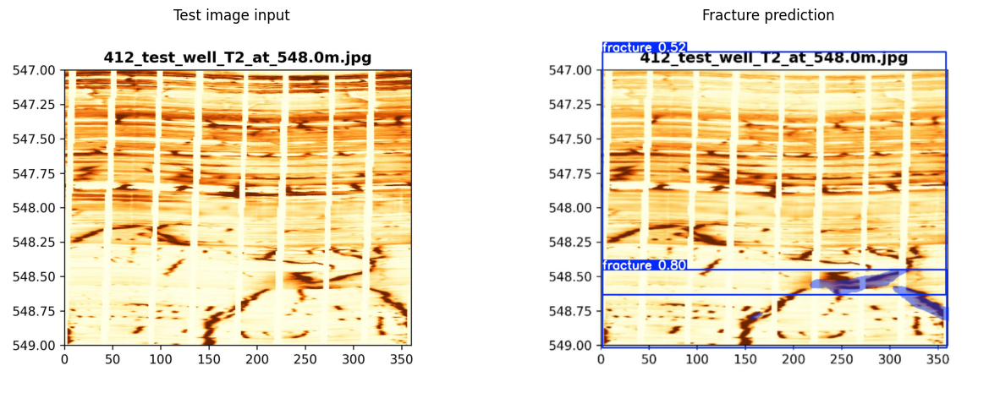

In [52]:
# Let's see one of the predictions from test wells

test_image1 = cv2.imread('./frac_data/test_images/T2/412_test_well_T2_at_548.0m.jpg') # , cv2.IMREAD_GRAYSCALE
test_pred1 = cv2.imread('./frac_data/test_predictions/T2/412_test_well_T2_at_548.0m_prediction2/image0.jpg')
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_pred1 = cv2.cvtColor(test_pred1, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 10))
plt.subplot(121)
plt.imshow(test_image1)
plt.title("Test image input")
plt.axis("off")
plt.subplot(122)
plt.imshow(test_pred1)
plt.title("Fracture prediction")
plt.axis("off")
plt.show()


The YOLO model predicts two fractures in the example above. However, the one with a confidence score of 0.52 is questionable due to its excessively large bounding box. The other prediction, with a confidence score of 0.80, seems more accurate but only detects a partial sinusoidal curve. Therefore, participants should carefully review all prediction results and select 9 fractures for the T1 well and 11 fractures for the T2 well.

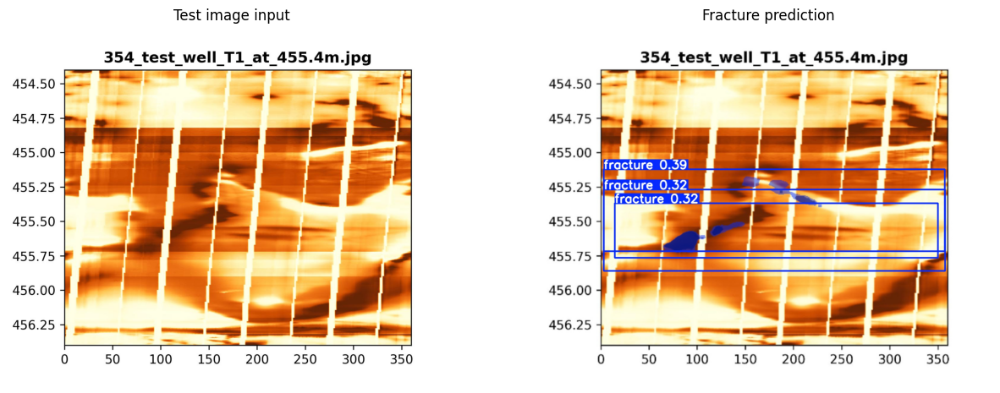

In [53]:
# Let's see another prediction example from test wells

test_image1 = cv2.imread('./frac_data/test_images/T1/354_test_well_T1_at_455.4m.jpg') # , cv2.IMREAD_GRAYSCALE
test_pred1 = cv2.imread('./frac_data/test_predictions/T1/354_test_well_T1_at_455.4m_prediction2/image0.jpg')
test_image1 = cv2.cvtColor(test_image1, cv2.COLOR_BGR2RGB)
test_pred1 = cv2.cvtColor(test_pred1, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 10))
plt.subplot(121)
plt.imshow(test_image1)
plt.title("Test image input")
plt.axis("off")
plt.subplot(122)
plt.imshow(test_pred1)
plt.title("Fracture prediction")
plt.axis("off")
plt.show()


In this instance, a single fracture was divided into multiple segments, and our YOLO model identified each segment separately.

Let's sort the detected fractures by confidence level and select the top 15 for the T1 well and the top 15 for the T2 well, respectively. These numbers can be determined by each participant.

In [54]:
# Sort detected fractures using confidence level
list_of_confidence_T1_sort, list_of_frac_depth_T1_sort = zip(*sorted(zip(list_of_confidence_T1, list_of_frac_depth_T1), reverse=True))
list_of_confidence_T2_sort, list_of_frac_depth_T2_sort = zip(*sorted(zip(list_of_confidence_T2, list_of_frac_depth_T2), reverse=True))

# There are unknown numbers of fractures on T1 and T2 wells.
# Therefore, we can choose some of detected fractures with highest confidence among 439 from T1 well
# Similarly, we can choose some of detected fractures with highest confidence among 575 from T2 well
print("Depths of 15 most probable fractures on T1 well are: ", list_of_frac_depth_T1_sort[:15])
print("Depths of 15 most probable fractures on T2 well are: ", list_of_frac_depth_T2_sort[:15])

# The above does NOT imply that there are 15 fractures in both the T1 and T2 wells.
# Keep in mind, there are many other smart ways to select these fractures — feel free to get creative!

Depths of 15 most probable fractures on T1 well are:  (222.44455430105876, 222.2679095227554, 222.1147712565457, 280.4493444685466, 307.4262956539261, 307.276700174023, 307.11685456119295, 271.57670617162074, 271.5742584764989, 271.43592911331933, 271.27904122311804, 408.4091665874754, 408.2793385874584, 408.0609325225499, 456.58381451656976)
Depths of 15 most probable fractures on T2 well are:  (318.27353930759386, 318.205110291613, 318.13304183929506, 318.0154435435661, 317.8535438858926, 317.74697527840505, 317.67857879906114, 178.19242192997135, 178.03586685348807, 177.88381103452073, 341.00649676278005, 340.8940866870276, 422.2982993904428, 422.12864631506534, 421.9071600269243)


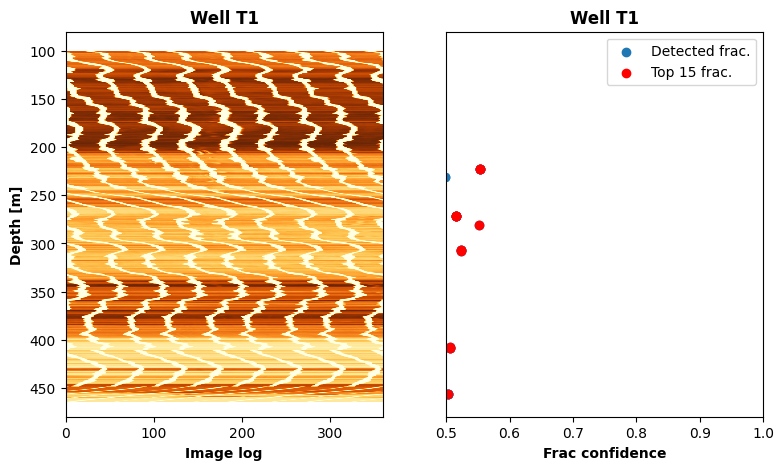

In [55]:
# Test T1 Well Image log and detected fractures with confidence
plt.figure(figsize=(9, 5))
plt.subplot(121)
plt.imshow(well_images["well_T1"], extent=[0, 360, np.max(well_images["well_T1"].index), np.min(well_images["well_T1"].index)], cmap=cm_default, aspect='auto')
plt.title("Well T1", weight="bold")
plt.xlabel("Image log", weight="bold")
plt.ylabel("Depth [m]", weight="bold")
plt.axis([0, 360, 480, 80])
plt.subplot(122)
plt.scatter(list_of_confidence_T1, list_of_frac_depth_T1, label="Detected frac.")
plt.scatter(list_of_confidence_T1_sort[:15], list_of_frac_depth_T1_sort[:15], color='red', label="Top 15 frac.") # 15 fractures with highest confidence
plt.title("Well T1", weight="bold")
plt.xlabel("Frac confidence", weight="bold")
plt.axis([0.5, 1, 480, 80])
plt.yticks([])
plt.legend(loc='upper right')
plt.show()


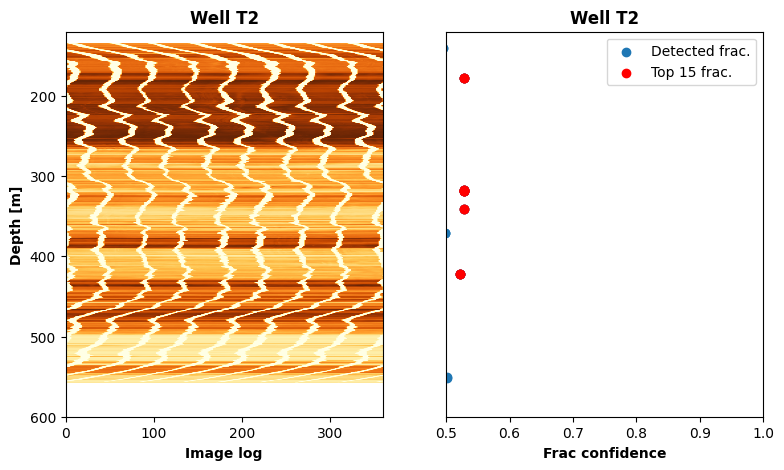

In [56]:
# Test T2 Well Image log and detected fractures with confidence
plt.figure(figsize=(9, 5))
plt.subplot(121)
plt.imshow(well_images["well_T2"], extent=[0, 360, np.max(well_images["well_T2"].index), np.min(well_images["well_T2"].index)], cmap=cm_default, aspect='auto')
plt.title("Well T2", weight="bold")
plt.xlabel("Image log", weight="bold")
plt.ylabel("Depth [m]", weight="bold")
plt.axis([0, 360, 600, 120])
plt.subplot(122)
plt.scatter(list_of_confidence_T2, list_of_frac_depth_T2, label="Detected frac.")
plt.scatter(list_of_confidence_T2_sort[:15], list_of_frac_depth_T2_sort[:15], color='red', label="Top 15 frac.") # 15 fractures with highest confidence
plt.title("Well T2", weight="bold")
plt.xlabel("Frac confidence", weight="bold")
plt.axis([0.5, 1, 600, 120])
plt.yticks([])
plt.legend(loc='upper right')
plt.show()


In [45]:
# Intentionally blank here

In [57]:
# Make a dataframe for the final output
number_of_T1_frac = 15
number_of_T2_frac = 15
Index = list(range(number_of_T1_frac + number_of_T2_frac))
Well = ['T1'] * number_of_T1_frac + ['T2'] * number_of_T2_frac
Depth = list(list_of_frac_depth_T1_sort[:number_of_T1_frac]) + list(list_of_frac_depth_T2_sort[:number_of_T2_frac])

df_output = {'Index': Index, 'Well': Well, 'Depth': Depth}
df_output = pd.DataFrame(df_output)
df_output

,Index,Well,Depth
0,0,T1,222.444554
1,1,T1,222.267910
2,2,T1,222.114771
3,3,T1,280.449344
4,4,T1,307.426296
5,5,T1,307.276700
6,6,T1,307.116855
7,7,T1,271.576706
8,8,T1,271.574258
9,9,T1,271.435929


Generate the CSV file named "submission.csv". Your CSV file should contain any number of rows between 1 and 99: the first n rows should list the depths of fractures for the T1 well, and remaining rows should list those for the T2 well. Please follow the same format as provided above. Then compress the csv file as a zip file with any name, preferably your own `team_name`.

Upload your zip file (`{team_name}.zip`) to the competition page on Codalab (https://codalab.org/). Details will be announced via email. Your score and ranking will be calculated and displayed in real-time.

The submission file must be a zip file with whatever name. However, the name of the csv file inside the zip has to be "submission.csv". (the csv file should be in the same format as “example_1.csv” file on the GitHub page in terms of number of columns, as well as exactly the same column names)

The submission status might need 10 seconds to be updated, please don't refresh the page too often. Users can find their scores through clicking a button named "Download output from scoring step". The users need to manually submit their best results to the leaderboard. Click "Participate" -> " Submit / View Results", click the "+" symbol in your submission. Be noted that the max submissions per day is 3 and the max submissions total is 100.



In [58]:
# Making prediction "your_team_name.csv" file

# Replace team_name
team_name = 'WELL_LOGGING_TOP1'

# Write results to csv file
df_output.to_csv('./submissions/submission.csv', index=False)


In [ ]:
# Example of the output score (scores_detail.txt)
# ==================================
# T1 Precision: 0.273
# T1 Recall: 0.333
# T1 F1 Score: 0.300
# T1 rmse: 65.751
# ==================================
# T2 Precision: 0.000
# T2 Recall: 0.000
# T2 F1 Score: 0.000
# T2 rmse: 118.189
# ==================================
# Overall F1 Score: 0.1304
# Overall rmse: 95.6341
# ==================================

## <a>8. Discussion</a>
Let's now discuss the results:

*   We successfully trained the YOLO model using data from 8 wells (A, B, C, D, E, F, G, and H), enabling it to predict potential fractures from image logs.

*   The image logs from the DLIS files are in grayscale. Maximizing image contrast by converting static images to dynamic ones significantly enhances prediction accuracy.

*   Participants should wisely select potential fractures from the T1 and T2 wells.

*   Several low hanging fruits to improve prediction results are described below:

*   Shuffling the training and validation datasets can improve the model's performance.

*   Considering our sample size is relatively small (~100+), data augmentation such as random cropping, flipping, and color adjustments can help too.

*   Dropping uncertain input fracture images from the training dataset can improve prediction performance.

*   Many fractures predicted by the ML model were either false positives or suspicious. Increasing the confidence threshold or applying a filter can help reduce this issue.

*   The YOLO model used in this example was the nano (n) version, which is the fastest but has the lowest performance. Participants are encouraged to test larger models (small (s), medium (m), large (l), and extra large (x)) as well.

*   If you decide not to use pretrained weight and retrain the model, optimize the hyperparameters thoughtfully. This may include adjusting the learning rate, batch size, or number of epochs to find the best settings for the given dataset.

*   Test well predictions will be evaluated using the F1 score. In cases where F1 scores are identical, RMSE will serve as the secondary evaluation metric.




Also, if you want to add more target data, there are several tools to segment your images.

In [ ]:
# Here is a list of tools that you can use for annotating images:

# MakeSense.AI
# LabelImg
# VGG image annotator
# LabelMe
# Scalable
# RectLabel

## <a>9. Summary</a>
In this tutorial, we demonstrate the machine-learning workflow on a practical petrophysical problem: preparing a image log data set, training and testing a prediction model, and finally, testing the model on the blind data to identify fractures. Libraries and open-source tools, such as scikit-learn provide powerful algorithms that can be applied to problems with a few lines of code, which greatly helps to facilitate the research of data science in the petrophysics area. In addition to the procedures mentioned above, many other methods may be applied to improve the performance and stability of the model, such as retraining YOLO model to obtain optimized weights, reprocessing input data, changing model, fine-tunning hyperparameters, and/
or combining them.

Lastly, you can try a fun social experiment: send your friends a few of your image logs, plus your prediction results, and ask them to guess which one is the real fracture!

If you have any questions, please reach out to "pdda_sig@spwla.org".

## <a>10. Acknowledgement</a>
We would like to thank ConocoPhillips Canada for the permission to utilize the image log dataset in developing the ML models of this study. Both SPWLA and ConocoPhillips do not accept any liabilities or make any warranty about the provided data.

